In [2]:
%matplotlib inline

import pandas as pd
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
from cnmf import cNMF
import os

import sys
sys.path.append('../../Code/')
from utils import read_dataset_log
from adjustText import adjust_text

from matplotlib.pyplot import rc_context
import seaborn as sns
from scipy.stats import ranksums
from scipy.stats import f_oneway
from scipy.stats import ttest_ind

In [3]:
figdir = '../../Figures/Components'

In [4]:
import math

In [5]:
params = read_dataset_log('Dataset Paths')
params.index = params['dataset']
params = params[params['dataset_type']=='discovery']
params

,dataset,usage_fn,gene_scores_fn,gene_tpm_fn,tcat_fn,tcat_fn_withsingletons,manual_gating_fn,manual_activation_gating_fn,activation_score_fn,metadata_fn,...,cnmf_dir,k,dt,processed_forcnmf_fn,tpm_counts_for_cnmf_fn,raw_counts_filt_fn,raw_counts_fn,dataset_type,tissue_type,context_label
dataset,,,,,,,,,,,,,,,,,,,,,
AMP-RA,AMP-RA,/data/srlab1/TCAT/Data/PerDataset/AMPRA/AMPRA....,/data/srlab1/TCAT/Data/PerDataset/AMPRA/AMPRA....,/data/srlab1/TCAT/Data/PerDataset/AMPRA/AMPRA....,/data/srlab1/TCAT/Data/TCAT/TCAT_Usage.2023101...,/data/srlab1/TCAT/Data/TCAT/TCAT_Usage.2023101...,NaN,NaN,/data/srlab1/TCAT/Data/PerDataset/AMPRA/Activa...,/data/srlab1/TCAT/Data/PerDataset/AMPRA/AMP_AD...,...,/data/srlab1/TCAT/Data/PerDataset/AMPRA,34.0,0_15,/data/srlab1/TCAT/Data/PerDataset/AMPRA/AMP_AD...,/data/srlab1/TCAT/Data/PerDataset/AMPRA/AMP_AD...,/data/srlab1/TCAT/Data/PerDataset/AMPRA/AMP_AD...,/data/srlab1/TCAT/Data/PerDataset/AMPRA/AMP_AD...,discovery,Synovium,RA+OA
Pan-Cancer,Pan-Cancer,/data/srlab1/TCAT/Data/PerDataset/Pancancer/Pa...,/data/srlab1/TCAT/Data/PerDataset/Pancancer/Pa...,/data/srlab1/TCAT/Data/PerDataset/Pancancer/Pa...,/data/srlab1/TCAT/Data/TCAT/TCAT_Usage.2023101...,/data/srlab1/TCAT/Data/TCAT/TCAT_Usage.2023101...,NaN,NaN,/data/srlab1/TCAT/Data/PerDataset/Pancancer/Ac...,/data/srlab1/TCAT/Data/PerDataset/Pancancer/pa...,...,/data/srlab1/TCAT/Data/PerDataset/Pancancer,38.0,0.15,/data/srlab1/TCAT/Data/PerDataset/Pancancer/pa...,NaN,/data/srlab1/TCAT/Data/PerDataset/Pancancer/pa...,/data/srlab1/TCAT/Data/PerDataset/Pancancer/pa...,discovery,Pan-Tissue,Cancer+Healthy
TBRU,TBRU,/data/srlab1/TCAT/Data/PerDataset/TBRU/TBRU.20...,/data/srlab1/TCAT/Data/PerDataset/TBRU/TBRU.20...,/data/srlab1/TCAT/Data/PerDataset/TBRU/TBRU.20...,/data/srlab1/TCAT/Data/TCAT/TCAT_Usage.2023101...,/data/srlab1/TCAT/Data/TCAT/TCAT_Usage.2023101...,NaN,NaN,/data/srlab1/TCAT/Data/PerDataset/TBRU/Activat...,/data/srlab1/TCAT/Data/PerDataset/TBRU/tbru_ex...,...,/data/srlab1/TCAT/Data/PerDataset/TBRU,36.0,0_20,/data/srlab1/TCAT/Data/PerDataset/TBRU/tbru_ex...,/data/srlab1/TCAT/Data/PerDataset/TBRU/tbru_ex...,/data/srlab1/TCAT/Data/PerDataset/TBRU/tbru_ex...,/data/srlab1/TCAT/Data/PerDataset/TBRU/tbru_ex...,discovery,Blood,Healthy
HIV-Vaccine,HIV-Vaccine,/data/srlab1/TCAT/Data/PerDataset/HaoEtAl/HIVV...,/data/srlab1/TCAT/Data/PerDataset/HaoEtAl/HIVV...,/data/srlab1/TCAT/Data/PerDataset/HaoEtAl/HIVV...,/data/srlab1/TCAT/Data/TCAT/TCAT_Usage.2023101...,/data/srlab1/TCAT/Data/TCAT/TCAT_Usage.2023101...,/data/srlab1/TCAT/Data/PerDataset/HaoEtAl/Manu...,NaN,/data/srlab1/TCAT/Data/PerDataset/HaoEtAl/Acti...,/data/srlab1/TCAT/Data/PerDataset/HaoEtAl/haoe...,...,/data/srlab1/TCAT/Data/PerDataset/HaoEtAl,31.0,0_15,/data/srlab1/TCAT/Data/PerDataset/HaoEtAl/haoe...,/data/srlab1/TCAT/Data/PerDataset/HaoEtAl/haoe...,/data/srlab1/TCAT/Data/PerDataset/HaoEtAl/haoe...,/data/srlab1/TCAT/Data/PerDataset/HaoEtAl/haoe...,discovery,Blood,Post-Vaccine+Healthy
UK-Covid,UK-Covid,/data/srlab1/TCAT/Data/PerDataset/UKCOVID/UKCO...,/data/srlab1/TCAT/Data/PerDataset/UKCOVID/UKCO...,/data/srlab1/TCAT/Data/PerDataset/UKCOVID/UKCO...,/data/srlab1/TCAT/Data/TCAT/TCAT_Usage.2023101...,/data/srlab1/TCAT/Data/TCAT/TCAT_Usage.2023101...,NaN,NaN,/data/srlab1/TCAT/Data/PerDataset/UKCOVID/Acti...,/data/srlab1/TCAT/Data/PerDataset/UKCOVID/hani...,...,/data/srlab1/TCAT/Data/PerDataset/UKCOVID,44.0,0_20,/data/srlab1/TCAT/Data/PerDataset/UKCOVID/hani...,NaN,/data/srlab1/TCAT/Data/PerDataset/UKCOVID/hani...,/data/srlab1/TCAT/Data/PerDataset/UKCOVID/hani...,discovery,Blood,Covid-19+Healthy
COMBAT,COMBAT,/data/srlab1/TCAT/Data/PerDataset/COMBAT/COMBA...,/data/srlab1/TCAT/Data/PerDataset/COMBAT/COMBA...,/data/srlab1/TCAT/Data/PerDataset/COMBAT/COMBA...,/data/srlab1/TCAT/Data/TCAT/TCAT_Usage.2023101...,/data/srlab1/TCAT/Data/TCAT/TCAT_Usage.2023101...,/data/srlab1/TCAT/Data/PerDataset/COMBAT/Manua...,/data/srlab1/TCAT/Data/PerDataset/COMBAT/Manua...,/data/srlab1/TCAT/Data/PerDataset/COMBAT/Activ...,/data/

In [6]:
cgep_info = read_dataset_log('cGEP_Name')
rename_map = dict(zip(cgep_info['cGep_Name'], cgep_info['Short_Name']))

In [7]:
toadd = '.TCAT.20231031.FiltSingletons'

In [8]:
'''Plot per-sample usage of a set of programs. Pass a dictionary with ylims or optionally prg display names.'''
def sample_usage_plot(prg_list, pheno_order, pheno, usage_meta_test, sample_col, cmap1, ylim_dict, 
                      color_col = None, pheno_map = None, 
                      figure_width = 6, height_scalar = 1.6, xticksize = 8, prg_names = {},
                     yticksize = 10, ylabel_fontsize = 10, hspace = 0.05, wspace = 0.05, pheno_label = None,
                     min_cells = 0, show_pvalue = False, pctl ='50%'):

    nrows = len(prg_list)
    ncols = len(pheno_order)
    panel_height = .8
    # hspace = 0.05
    # figure_width = 6
    figure_height = height_scalar*len(prg_list)
    # heatmap_width = 4
    # wspace = .05
    cbar_fontsize=6
    x_margin_scalar = 1
    
    if not pheno_label:
        pheno_label = dict(zip(pheno_order, pheno_order))

    # ylim = (-0.02, 0.22)
    fig = plt.figure(constrained_layout=True,dpi=450, figsize=(figure_width,figure_height)) 
    axes = []
    gs = fig.add_gridspec(nrows, ncols, 
                          width_ratios = usage_meta_test[[pheno, sample_col]].drop_duplicates()[pheno].value_counts()[pheno_order],
                          #width_ratios = usage_meta_test[pheno].value_counts()[pheno_order],
                          wspace=wspace, hspace=hspace)

    for k in range(nrows):
        rowax = []
        for j in range(ncols):
            if k != (nrows-1):
                rowax.append(fig.add_subplot(gs[k, j], ))
            else:
                rowax.append(fig.add_subplot(gs[k, j], ))
        axes.append(rowax)
    axes = np.array(axes)

    for k, prg in enumerate(prg_list):

        if prg in ylim_dict.keys():
            ylim = ylim_dict[prg]
        else:
            ylim = (-0.02, 0.22)

        for j, pheno_name in enumerate(pheno_order):

            pheno_usg = usage_meta_test[usage_meta_test[pheno]== pheno_order[j]]
            filt_samples = pheno_usg.groupby(sample_col).count()[pheno] > min_cells
            # print(pheno_usg.groupby(sample_col).count()[pheno])
            
            filt_samples = filt_samples[filt_samples].index
            print('Num samples with <= %i cells: %i' % (min_cells, 
                                                        (len(pheno_usg[sample_col].unique()) - 
                                                        len(filt_samples))))

            summary_df = pheno_usg[[prg, sample_col]].groupby(sample_col).describe(percentiles = [.1, .5, .9]).droplevel(0, axis = 1)
            summary_df = summary_df.loc[filt_samples, :]
            summary_df[color_col] = pheno_usg[[sample_col,
                    color_col]].drop_duplicates().set_index(sample_col).loc[summary_df.index, 
                    color_col]
            summary_df = summary_df.sort_values([color_col, '50%', 'std'], ascending = False)
            lower_error = summary_df['50%']-summary_df['10%']
            upper_error = summary_df['90%']-summary_df['50%']
            # print(summary_df.head())


            axes[k, j].errorbar(x = summary_df.index, y = summary_df['50%'], yerr = [lower_error, upper_error], #var_df[prg].fillna(0), 
                        fmt='none', lw = 1,
                       ecolor = cmap1(summary_df[color_col].map(pheno_map)), alpha = 0.7)
            axes[k, j].scatter(summary_df.index, summary_df['50%'], c = cmap1(summary_df[color_col].map(pheno_map)), s = 10,
                      marker = 'o', alpha = 0.7)
            axes[k, j].margins(x = x_margin_scalar/(
                usage_meta_test[[pheno, sample_col]].drop_duplicates()[pheno].value_counts()[pheno_order])[j])
            axes[k, j].set_ylim(ylim)

            ### Add horizontal bar across color group for average usage
            for subtype in summary_df[color_col].unique():
                fromv = summary_df[summary_df[color_col] == subtype].index[0] #min(x[organ==o])
                tov = summary_df[summary_df[color_col] == subtype].index[-1] #max(x[organ==o])
                average = pheno_usg[pheno_usg[color_col] == subtype][prg].mean()
                axes[k, j].hlines(y=average, xmin=fromv, xmax=tov, lw = 1, alpha = 0.7,
                                  color=cmap1(pd.Series(subtype).map(pheno_map)))
                
            ### ANOVA within color_col
            if show_pvalue and (len(summary_df[color_col].unique()) > 1):
                dat = summary_df[[pctl, color_col]].reset_index()
                color_stats = [dat[dat[color_col]==c][pctl].tolist() for c in dat[color_col].unique()]
                _, pval = f_oneway(*color_stats)
                axes[k, j].text(.5, .90, s = 'p-val=%.2E' % pval, horizontalalignment='center',
                        transform=axes[k, j].transAxes, fontsize = 5)

    
            ### Remove labels if color_col is identical to pheno col
            if (k!=(nrows-1) or color_col == pheno):
                axes[k, j].set_xticks([])
                axes[k, j].set_xticklabels('')
            else:
                axes[k, j].set_xticklabels(labels = ['' if (val) else summary_df.loc[sample, color_col] for 
                                 (sample, val) in summary_df[color_col].duplicated().iteritems()], 
                       rotation = 90, fontsize = xticksize)  
                
            if k==(nrows-1):
                axes[k, j].set_xlabel(pheno_label[pheno_name])

            if j==0:
                axes[k, j].tick_params(axis='y', labelsize=yticksize)
                axes[k, j].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))

                if prg in prg_names.keys():
                    axes[k, j].set_ylabel(prg_names[prg], fontsize = ylabel_fontsize)
                else:
                    axes[k, j].set_ylabel(prg, fontsize = ylabel_fontsize)

            else:
                axes[k, j].set_yticks([])
                # axes[k, j].set_yticklabels([''])

        # fig.suptitle(pheno, #fontsize=20
        #             )
    plt.show()    
    
    return fig


In [452]:
# '''Plot per-sample usage of a set of programs. Pass a dictionary with ylims or optionally prg display names.'''
# def sample_usage_plot(prg_list, pheno_order, pheno, usage_meta_test, sample_col, cmap1, ylim_dict, 
#                       color_col = None, pheno_map = None, 
#                       figure_width = 6, height_scalar = 1.6, xticksize = 8, prg_names = {},
#                      yticksize = 10, ylabel_fontsize = 10, hspace = 0.05, wspace = 0.05, pheno_label = None,
#                      min_cells = 0):

#     nrows = len(prg_list)
#     ncols = len(pheno_order)
#     panel_height = .8
#     # hspace = 0.05
#     # figure_width = 6
#     figure_height = height_scalar*len(prg_list)
#     # heatmap_width = 4
#     # wspace = .05
#     cbar_fontsize=6
#     x_margin_scalar = 1
    
#     if not pheno_label:
#         pheno_label = dict(zip(pheno_order, pheno_order))

#     # ylim = (-0.02, 0.22)
#     fig = plt.figure(constrained_layout=True,dpi=450, figsize=(figure_width,figure_height)) 
#     axes = []
#     gs = fig.add_gridspec(nrows, ncols, 
#                           width_ratios = usage_meta_test[[pheno, sample_col]].drop_duplicates()[pheno].value_counts()[pheno_order],
#                           #width_ratios = usage_meta_test[pheno].value_counts()[pheno_order],
#                           wspace=wspace, hspace=hspace)

#     for k in range(nrows):
#         rowax = []
#         for j in range(ncols):
#             if k != (nrows-1):
#                 rowax.append(fig.add_subplot(gs[k, j], ))
#             else:
#                 rowax.append(fig.add_subplot(gs[k, j], ))
#         axes.append(rowax)
#     axes = np.array(axes)

#     for k, prg in enumerate(prg_list):

#         if prg in ylim_dict.keys():
#             ylim = ylim_dict[prg]
#         else:
#             ylim = (-0.02, 0.22)


#         for j, pheno_name in enumerate(pheno_order):

#             pheno_usg = usage_meta_test[usage_meta_test[pheno]== pheno_order[j]]
#             filt_samples = pheno_usg.groupby(sample_col).count()[pheno] > min_cells
#             filt_samples = filt_samples[filt_samples].index
#             print('Num samples with <= %i cells: %i' % (min_cells, 
#                                                         (len(pheno_usg[sample_col].unique()) - 
#                                                         len(filt_samples))))

#             summary_df = pheno_usg[[prg, sample_col]].groupby(sample_col).describe(percentiles = [.1, .5, .9]).droplevel(0, axis = 1)
#             summary_df = summary_df.loc[filt_samples, :]
#             summary_df[color_col] = pheno_usg[[sample_col,
#                     color_col]].drop_duplicates().set_index(sample_col).loc[summary_df.index, 
#                     color_col]
#             summary_df = summary_df.sort_values([color_col, '50%', 'std'], ascending = False)
#             lower_error = summary_df['50%']-summary_df['10%']
#             upper_error = summary_df['90%']-summary_df['50%']


#             axes[k, j].errorbar(x = summary_df.index, y = summary_df['50%'], yerr = [lower_error, upper_error], #var_df[prg].fillna(0), 
#                         fmt='none', lw = 1,
#                        ecolor = cmap1(summary_df[color_col].map(pheno_map)), alpha = 0.7)
#             axes[k, j].scatter(summary_df.index, summary_df['50%'], c = cmap1(summary_df[color_col].map(pheno_map)), s = 10,
#                       marker = 'o', alpha = 0.7)
#             axes[k, j].margins(x = x_margin_scalar/(
#                 usage_meta_test[[pheno, sample_col]].drop_duplicates()[pheno].value_counts()[pheno_order])[j])
#             axes[k, j].set_ylim(ylim)

#             ### Add horizontal bar across color group for average usage
#             for subtype in summary_df[color_col].unique():
#                 fromv = summary_df[summary_df[color_col] == subtype].index[0] #min(x[organ==o])
#                 tov = summary_df[summary_df[color_col] == subtype].index[-1] #max(x[organ==o])
#                 average = pheno_usg[pheno_usg[color_col] == subtype][prg].mean()
#                 axes[k, j].hlines(y=average, xmin=fromv, xmax=tov, lw = 1, alpha = 0.7,
#                                   color=cmap1(pd.Series(subtype).map(pheno_map)))

#             ### Remove labels if color_col is identical to pheno col
#             if (k!=(nrows-1) or color_col == pheno):
#                 axes[k, j].set_xticks([])
#                 axes[k, j].set_xticklabels('')
#             else:
#                 axes[k, j].set_xticklabels(labels = ['' if (val) else summary_df.loc[sample, color_col] for 
#                                  (sample, val) in summary_df[color_col].duplicated().iteritems()], 
#                        rotation = 90, fontsize = xticksize)  
                
#             if k==(nrows-1):
#                 axes[k, j].set_xlabel(pheno_label[pheno_name])

#             if j==0:
#                 axes[k, j].tick_params(axis='y', labelsize=yticksize)

#                 if prg in prg_names.keys():
#                     axes[k, j].set_ylabel(prg_names[prg], fontsize = ylabel_fontsize)
#                 else:
#                     axes[k, j].set_ylabel(prg, fontsize = ylabel_fontsize)

#             else:
#                 axes[k, j].set_yticklabels('')

#         fig.suptitle(pheno, #fontsize=20
#                     )
#     plt.show()
    


In [53]:
def sample_usage_striplot(prg_list, pheno_order, pheno, usage_meta_test, sample_col, cmap_stripplot, pheno_map,
                         width_scalar = 5/3, 
                          height_scalar = 1.6, pt_size = 2, min_cells = 0, mean = False,
                         qntl = 0.95, show_pvalue = False, yticksize = 6, titlesize = 9,
                         labelsize = 7, ncols = 3, wspace = 0.05, hspace = 0.05, ranksums_test = True):
    nrows = math.ceil(len(prg_list)/ncols)
    figure_width = width_scalar*ncols
    figure_height = height_scalar*nrows

    fig, axes = plt.subplots(#constrained_layout=True,
                             dpi=450, figsize=(figure_width,figure_height),
                 nrows = nrows, ncols =  ncols) 
    for k, prg in enumerate(prg_list):
        i = k//ncols
        j = k%ncols
        dat = pd.DataFrame()

        for n, pheno_name in enumerate(pheno_order):
            pheno_usg = usage_meta_test[usage_meta_test[pheno]== pheno_order[n]]
            filt_samples = pheno_usg.groupby(sample_col).count()[pheno] > min_cells
            filt_samples = filt_samples[filt_samples].index
            
            if mean==False:
                sample_quant_usg = pd.DataFrame(pheno_usg[[prg, sample_col]].groupby(sample_col).quantile(qntl))
            else:
                sample_quant_usg = pd.DataFrame(pheno_usg[[prg, sample_col]].groupby(sample_col).mean())
                
            sample_quant_usg[pheno] = pheno_name
            sample_quant_usg = sample_quant_usg.loc[filt_samples, :]
            
            dat = dat.append(sample_quant_usg.reset_index())
            print(pheno_name)
            display(dat.head())
            
            dat_mean = dat.groupby(pheno).median()           
            

        # fig, ax = plt.subplots()
        if nrows > 1:
            ax = axes[i, j]
        elif ncols >1:
            ax = axes[j]
        else: 
            ax = axes
        sns.stripplot(data=dat, x=pheno, y=prg, order = pheno_order, ax = ax, size = pt_size)
        xlim = ax.get_xlim()

        for n, pheno_name in enumerate(pheno_order):
            ax.hlines(y = dat_mean.loc[pheno_name][0], xmin = n-.2, xmax = n+.2, color = cmap_stripplot(n))    
        if show_pvalue:
            x = dat[dat[pheno]==pheno_order[0]][prg]
            y = dat[dat[pheno]==pheno_order[1]][prg]
            if ranksums_test:
                _, pval = ranksums(x, y)
            else:
                _, pval = ttest_ind(x, y, equal_var = False)
            ax.text(.5, .8, #.9
                    s = 'p-val=\n%.2E' % pval, horizontalalignment='center',
                    transform=ax.transAxes, fontsize = 5)
        
        ax.set_xlim(xlim)
        # plt.show()

        # if j==0:
        #     ax.set_ylabel('Usage', fontsize = labelsize)
        # else:
        #     ax.set_ylabel('')
        if len(prg_list)-(k+1) >= ncols:
            ax.set_xticks([])
            
        ax.set_ylabel(prg, fontsize = labelsize)
        # ax.set_title(prg, fontsize = titlesize)
        # if k==(ncols-1):
        #     print(k)
        #     axes[k].set_xlabel(pheno)
        # else:
        ax.tick_params(axis='y', labelsize=yticksize)
        ax.yaxis.set_major_formatter(FormatStrFormatter('%.3f'))
        ax.tick_params(axis='x', labelsize=labelsize)
        ax.set_xlabel('')
    
    plt.subplots_adjust(wspace=wspace, hspace=hspace)
    # plt.show()
    return fig


In [10]:
from matplotlib.ticker import FormatStrFormatter

# def sample_usage_striplot(prg_list, pheno_order, pheno, usage_meta_test, sample_col, cmap_stripplot, pheno_map,
#                          width_scalar = 5/3, 
#                           height_scalar = 1.6, pt_size = 2, min_cells = 0,
#                          qntl = 0.95, show_pvalue = False, yticksize = 6, titlesize = 9,
#                          labelsize = 7, ncols = 3, wspace = 0.05, hspace = 0.05):
#     nrows = math.ceil(len(prg_list)/ncols)
#     figure_width = width_scalar*ncols
#     figure_height = height_scalar*nrows

#     fig, axes = plt.subplots(#constrained_layout=True,
#                              dpi=450, figsize=(figure_width,figure_height),
#                  nrows = nrows, ncols =  ncols) 
#     for k, prg in enumerate(prg_list):
#         i = k//ncols
#         j = k%ncols
#         dat = pd.DataFrame()

#         for n, pheno_name in enumerate(pheno_order):
#             pheno_usg = usage_meta_test[usage_meta_test[pheno]== pheno_order[n]]
#             filt_samples = pheno_usg.groupby(sample_col).count()[pheno] > min_cells
#             filt_samples = filt_samples[filt_samples].index
            
#             sample_quant_usg = pd.DataFrame(pheno_usg[[prg, sample_col]].groupby(sample_col).quantile(qntl))
#             sample_quant_usg[pheno] = pheno_name
#             sample_quant_usg = sample_quant_usg.loc[filt_samples, :]
            
#             dat = dat.append(sample_quant_usg.reset_index())
#             dat_mean = dat.groupby(pheno).median()
            

#         # fig, ax = plt.subplots()
#         ax = axes[i, j]
#         sns.stripplot(data=dat, x=pheno, y=prg, order = pheno_order, ax = ax, size = pt_size)
#         xlim = ax.get_xlim()

#         for n, pheno_name in enumerate(pheno_order):
#             ax.hlines(y = dat_mean.loc[pheno_name][0], xmin = n-.2, xmax = n+.2, color = cmap_stripplot(n))    
#         if show_pvalue:
#             x = dat[dat[pheno]==pheno_order[0]][prg]
#             y = dat[dat[pheno]==pheno_order[1]][prg]
#             _, pval = ranksums(x, y)
#             ax.text(.5, .90, s = 'p-val=%.2E' % pval, horizontalalignment='center',
#                     transform=ax.transAxes, fontsize = 5)
        
#         ax.set_xlim(xlim)
#         # plt.show()

#         # if j==0:
#         #     ax.set_ylabel('Usage', fontsize = labelsize)
#         # else:
#         #     ax.set_ylabel('')
#         if len(prg_list)-(k+1) >= ncols:
#             ax.set_xticks([])
            
#         ax.set_ylabel(prg, fontsize = labelsize)
#         # ax.set_title(prg, fontsize = titlesize)
#         # if k==(ncols-1):
#         #     print(k)
#         #     axes[k].set_xlabel(pheno)
#         # else:
#         ax.tick_params(axis='y', labelsize=yticksize)
#         ax.yaxis.set_major_formatter(FormatStrFormatter('%.3f'))
#         ax.tick_params(axis='x', labelsize=labelsize)
#         ax.set_xlabel('')
    
#     plt.subplots_adjust(wspace=wspace, hspace=hspace)
#     # plt.show()
#     return fig


In [629]:
# def sample_usage_striplot(prg_list, pheno_order, pheno, usage_meta_test, sample_col, cmap_stripplot, pheno_map,
#                          figure_height = 4, width_scalar = 1.6, pt_size = 2, min_cells = 0,
#                          qntl = 0.95, show_pvalue = False, yticksize = 6, titlesize = 9,
#                          labelsize = 7):
#     nrows = 1#len(prg_list)
#     ncols = len(prg_list)#len(pheno_order)
#     figure_width = width_scalar*len(prg_list)

#     fig, axes = plt.subplots(constrained_layout=True,dpi=450, figsize=(figure_width,figure_height),
#                  nrows = nrows, ncols =  ncols) 
#     for k, prg in enumerate(prg_list):
#         print(prg)

#         dat = pd.DataFrame()

#         for j, pheno_name in enumerate(pheno_order):
#             pheno_usg = usage_meta_test[usage_meta_test[pheno]== pheno_order[j]]
#             filt_samples = pheno_usg.groupby(sample_col).count()[pheno] > min_cells
#             filt_samples = filt_samples[filt_samples].index
            
#             sample_quant_usg = pd.DataFrame(pheno_usg[[prg, sample_col]].groupby(sample_col).quantile(qntl))
#             sample_quant_usg[pheno] = pheno_name
#             sample_quant_usg = sample_quant_usg.loc[filt_samples, :]
            
#             dat = dat.append(sample_quant_usg.reset_index())
#             dat_mean = dat.groupby(pheno).median()
            

#         # fig, ax = plt.subplots()
#         ax = axes[k]
#         sns.stripplot(data=dat, x=pheno, y=prg, order = pheno_order, ax = ax, size = pt_size)
#         xlim = ax.get_xlim()

#         for j, pheno_name in enumerate(pheno_order):
#             ax.hlines(y = dat_mean.loc[pheno_name][0], xmin = j-.2, xmax = j+.2, color = cmap_stripplot(j))    
#         if show_pvalue:
#             x = dat[dat[pheno]==pheno_order[0]][prg]
#             y = dat[dat[pheno]==pheno_order[1]][prg]
#             _, pval = ranksums(x, y)
#             ax.text(.5, .93, s = 'p-val=%.2E' % pval, horizontalalignment='center',
#                     transform=ax.transAxes, fontsize = 5)
        
#         ax.set_xlim(xlim)
#         # plt.show()

#         if k==0:
#             ax.set_ylabel('Usage', fontsize = labelsize)
#         else:
#             ax.set_ylabel('')
#         ax.set_title(prg, fontsize = titlesize)
#         # if k==(ncols-1):
#         #     print(k)
#         #     axes[k].set_xlabel(pheno)
#         # else:
#         ax.tick_params(axis='y', labelsize=yticksize)
#         ax.tick_params(axis='x', labelsize=labelsize)
#         ax.set_xlabel('')
        
#     plt.show()


In [11]:
def sample_striplot_combined(prg_list, pheno_order, pheno, usage_meta_test, sample_col, cmap_stripplot, pheno_map,
                         figure_width = 5, 
                        figure_height = 3, #pt_size = 2,
                             min_cells = 0,
                         qntl = 0.95, show_pvalue = False, #yticksize = 6, titlesize = 9,
                         labelsize = 7, prg_order = None):

    fig, ax = plt.subplots(#constrained_layout=True,
                             dpi=300, figsize=(figure_width, figure_height),
                 nrows = 1, ncols =  1) 
    
    dat = pd.DataFrame()
    for n, pheno_name in enumerate(pheno_order):
        pheno_usg = usage_meta_test[usage_meta_test[pheno]== pheno_order[n]]
        filt_samples = pheno_usg.groupby(sample_col).count()[pheno] > min_cells
        filt_samples = filt_samples[filt_samples].index
        
        for k, prg in enumerate(prg_list):
            sample_quant_usg = pd.DataFrame(pheno_usg[[prg, sample_col]].groupby(sample_col).quantile(qntl))
            sample_quant_usg[pheno] = pheno_name
            sample_quant_usg = sample_quant_usg.loc[filt_samples, :]
                        
            sample_quant_usg = sample_quant_usg.reset_index()
            sample_quant_usg['prg'] = prg
            sample_quant_usg = sample_quant_usg.rename({prg : 'value'}, axis = 1)

            dat = dat.append(sample_quant_usg)
            # dat_mean = dat.groupby(pheno, prg).median()
            
    if prg_order==None:
        prg_order = list(dat.groupby('prg').median().sort_values('value', ascending = False).index)
        print(prg_order)
    
    dat_mean = dat.groupby(['prg', pheno]).median()

    sns.stripplot(data=dat, x='prg', y='value', hue = pheno, jitter = .15,
                  dodge=True, ax = ax, hue_order = pheno_order, order = prg_order, size = 3.5)
    for k, prg in enumerate(prg_order):
        for n, pheno_name in zip([-1, 1], pheno_order):
            x_scalar = .2
            ax.hlines(y = dat_mean.loc[(prg, pheno_name), 'value'], 
                      xmin = k-.2 +n*x_scalar , xmax = k+.2 +n*x_scalar, color = 'black',#cmap_stripplot(n)
                      zorder = 3)    
    ax.legend(loc = 'upper right')
    ax.tick_params('x', rotation = 90)
    ax.set_ylabel('Average cGEP usage')
    ax.set_xlabel('cGEP')
    
    return fig

In [12]:
from matplotlib import cm
from matplotlib.colors import ListedColormap



In [13]:
res_df = pd.read_csv('../../Data/TCAT/PhenotypeAssociationResults_TTest%s.txt' % toadd,
                    index_col = 0, 
                    sep = '\t')

res_df['cGEP'] = res_df['cGEP'].map(rename_map)

res_df['log2fc'] = np.log2(res_df['fold_change'])

In [14]:
pheno_params = pd.read_csv('../../Data/TCAT/PhenotypeAssociation_Parameters%s.txt' % toadd,
                          index_col = 0, sep = '\t')

# AMP-RA

In [982]:
dataset = 'AMP-RA'

In [983]:
# for dataset in pheno_params['dataset'].unique():
sample_col = params.loc[dataset, 'sample_col']
individual_col = params.loc[dataset, 'individual_col']
usage = pd.read_csv(params.loc[dataset, 'tcat_fn'], index_col = 0, sep = '\t')
usage.columns = usage.columns.map(rename_map)

meta = pd.read_csv(params.loc[dataset, 'metadata_fn'].replace('metadata', 'metadata_PhenotypeAssociations'),
                  index_col = 0, sep = '\t')
pheno_params_ds = pheno_params[pheno_params['dataset']==dataset]
res_df_ds = res_df[res_df['dataset']==dataset]

In [984]:
usage.shape

(94048, 52)

In [985]:
pheno_cols = pheno_params_ds['pheno_col_orig'].unique()

In [986]:
usage_meta = usage.merge(meta, left_index = True, right_index = True)
usage_meta = usage_meta.loc[usage.index, ]

# Define mean usage for each phenotype
usage_phenos = pd.DataFrame()
for pheno in pheno_cols:
    with rc_context({'figure.figsize': (4, 4), 'figure.dpi':200}):
        avg_usg = usage.groupby(meta.loc[usage.index, pheno]).mean().T
        usage_phenos = pd.concat([usage_phenos, avg_usg], axis = 1)
        # g = sns.clustermap(avg_usg)
        # plt.show()


In [987]:
pheno_cols

array(['disease_status', 'CTAP'], dtype=object)

In [988]:
pheno = pheno_cols[0]
color_col = 'CTAP'#pheno_cols[0]



In [989]:
usage_meta_test = usage_meta.loc[usage_meta[pheno].dropna().index, ]

In [990]:
pheno_orders = [usage_meta_test[x].unique() for x in pheno_cols]
pheno_order = pheno_orders[0]

In [640]:
pheno_orders

[array(['OA', 'RA'], dtype=object),
 array(['OA', 'M', 'E + F + M', 'T + M', 'T + B', 'F', 'T + F'],
       dtype=object)]

In [991]:
pheno_map = usage_meta[color_col].unique()
pheno_map = dict(zip( pheno_map, range(0, len(pheno_map))))


In [992]:
ylim_dict = {}

In [1005]:
prg_list = res_df_ds[(res_df_ds['pheno_col']==pheno) & (res_df_ds['padj']< 0.05)].sort_values('log2fc', key = abs, ascending = False)
prg_list = prg_list[prg_list['pheno_col']==pheno]['cGEP'].unique()

In [1008]:
prg_list

array(['CellCycle-G2M', 'Tph', 'HLA', 'Metallothionein', 'CellCycle-S',
       'ICOS/CD38-Activation', 'CCR10-Migration',
       'CTLA4+/CD38+-Activation', 'Early-Activation'], dtype=object)

In [1007]:
res_df_ds[(res_df_ds['pheno_col']==pheno) & 
          (res_df_ds['padj']< 0.05)].sort_values('log2fc', key = abs, ascending = False)


,dataset,cGEP,t-stat,pval,padj,fold_change,pheno_col_orig,pheno_col,phenotypes,type,log2fc
0,AMP-RA,CellCycle-G2M,-4.328322,4.346323e-04,0.022601,0.334159,disease_status,disease_status,"OA,RA",unpaired,-1.581392
49,AMP-RA,Tph,-4.371365,9.106425e-05,0.004735,0.359421,disease_status,disease_status,"OA,RA",unpaired,-1.476254
2,AMP-RA,HLA,-5.560588,2.068367e-05,0.001076,0.372973,disease_status,disease_status,"OA,RA",unpaired,-1.422858
19,AMP-RA,Metallothionein,-6.257244,3.999850e-08,0.000002,0.453720,disease_status,disease_status,"OA,RA",unpaired,-1.140126
7,AMP-RA,CellCycle-S,-4.910163,1.308086e-05,0.000680,0.490454,disease_status,disease_status,"OA,RA",unpaired,-1.027812
36,AMP-RA,ICOS/CD38-Activation,-7.416738,3.281559e-08,0.000002,0.499063,disease_status,disease_status,"OA,RA",unpaired,-1.002705
11,AMP-RA,CCR10-Migration,-4.422753,2.276199e-04,0.011836,0.518567,disease_status,disease_status,"OA,RA",unpaired,-0.947398
39,AMP-RA,CTLA4+/CD38+-Activation,-5.538557,6.342282e-06,0.000330,0.591810,disease_status,disease_status,"OA,RA",unpaired,-0.756795
10,AMP-RA,Early-Activation,-4.272272,1.413780e-04,0.007352,0.592353,disease_status,disease_status,"OA,RA",unpaired,-0.755472


In [995]:
cmap = cm.get_cmap('tab10', 10)

In [24]:
# pheno_label = [{'P':'PBMC', 'N': 'NAT', 'T':'Tumor'}, {}]


In [996]:
pheno, pheno_order

('disease_status', array(['OA', 'RA'], dtype=object))

In [352]:
# prg_list = ['Tph', 'Tfh-1', 'Tfh-2', 'ISG', 'ICOS/CD38-Activation']

In [997]:
pheno_order = ['RA', 'OA']

/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:79: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:79: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:79: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:79: MatplotlibDeprecationWarning: Suppor

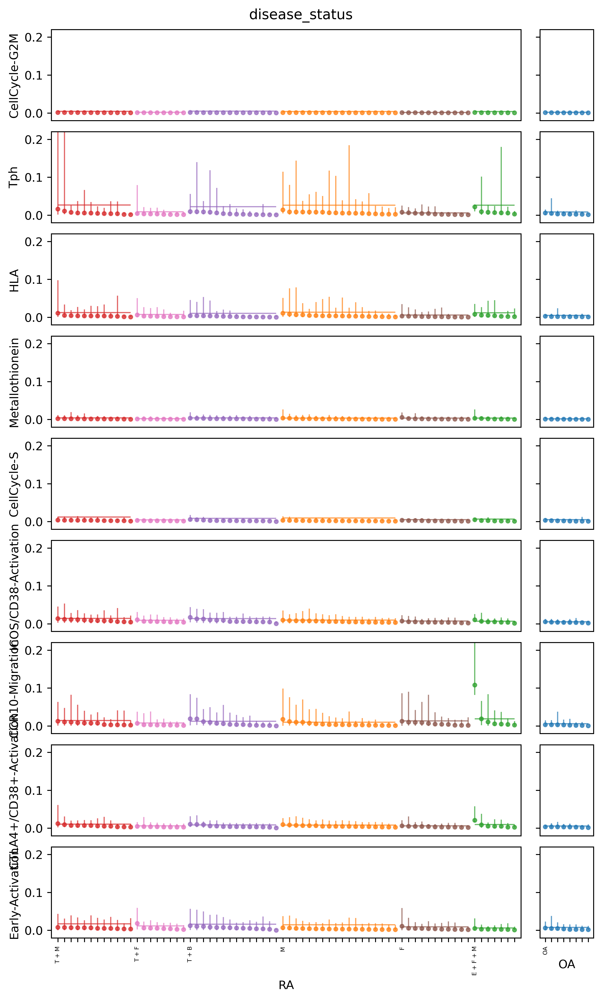

In [152]:
sample_usage_plot(prg_list, pheno_order, pheno, usage_meta_test, individual_col, 
                  cmap, ylim_dict, color_col, pheno_map, 
                 height_scalar = 1.3, figure_width = 7, xticksize = 5)

In [378]:
prg_list

['Tph', 'Tfh', 'MAIT', 'Cytotoxic']

In [718]:
ylim_dict = {'Tph': (-0.02, 0.15), 'HLA' : (-0.01, 0.06), 
            'ICOS/CD38-Activation' : (-0.01, 0.05)}

In [719]:
# prg_list = ['Tph', 'HLA','ICOS/CD38-Activation', #'ISG'
#            ]

Num samples with <= 10 cells: 1


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:86: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:86: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 1
Num samples with <= 10 cells: 1


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:86: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:86: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 1
Num samples with <= 10 cells: 1


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:91: UserWarning: FixedFormatter should only be used together with FixedLocator
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:91: UserWarning: FixedFormatter should only be used together with FixedLocator


Num samples with <= 10 cells: 1


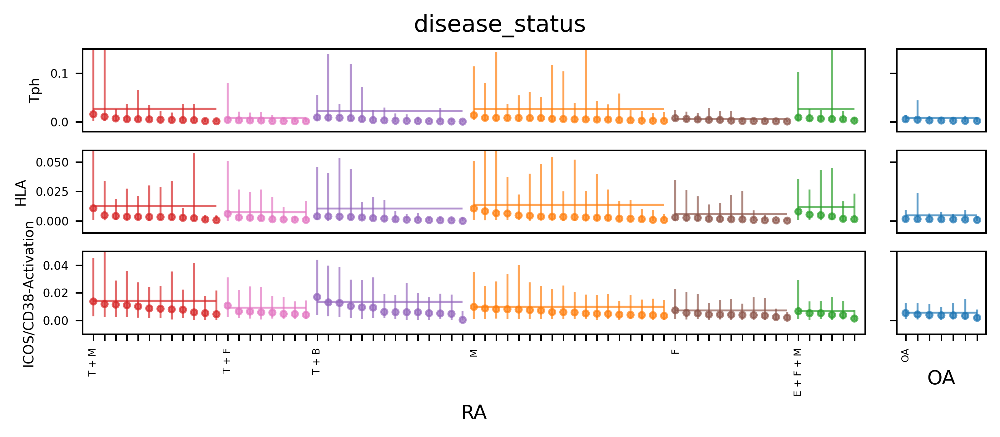

In [453]:
sample_usage_plot(prg_list, pheno_order, pheno, usage_meta_test, individual_col, 
                  cmap, ylim_dict, color_col, pheno_map,
                 height_scalar = 1, figure_width = 7, xticksize = 5, yticksize = 6, 
                  ylabel_fontsize = 7, min_cells = 10)

Num samples with <= 10 cells: 1


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:95: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:95: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 1
Num samples with <= 10 cells: 1


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:95: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:95: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 1
Num samples with <= 10 cells: 1


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:95: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:95: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 1
Num samples with <= 10 cells: 1


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:95: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:95: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 1
Num samples with <= 10 cells: 1


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:95: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:95: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 1
Num samples with <= 10 cells: 1


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:95: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:95: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 1
Num samples with <= 10 cells: 1


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:95: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:95: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 1
Num samples with <= 10 cells: 1


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:95: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:95: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 1
Num samples with <= 10 cells: 1


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:100: UserWarning: FixedFormatter should only be used together with FixedLocator


Num samples with <= 10 cells: 1


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:100: UserWarning: FixedFormatter should only be used together with FixedLocator


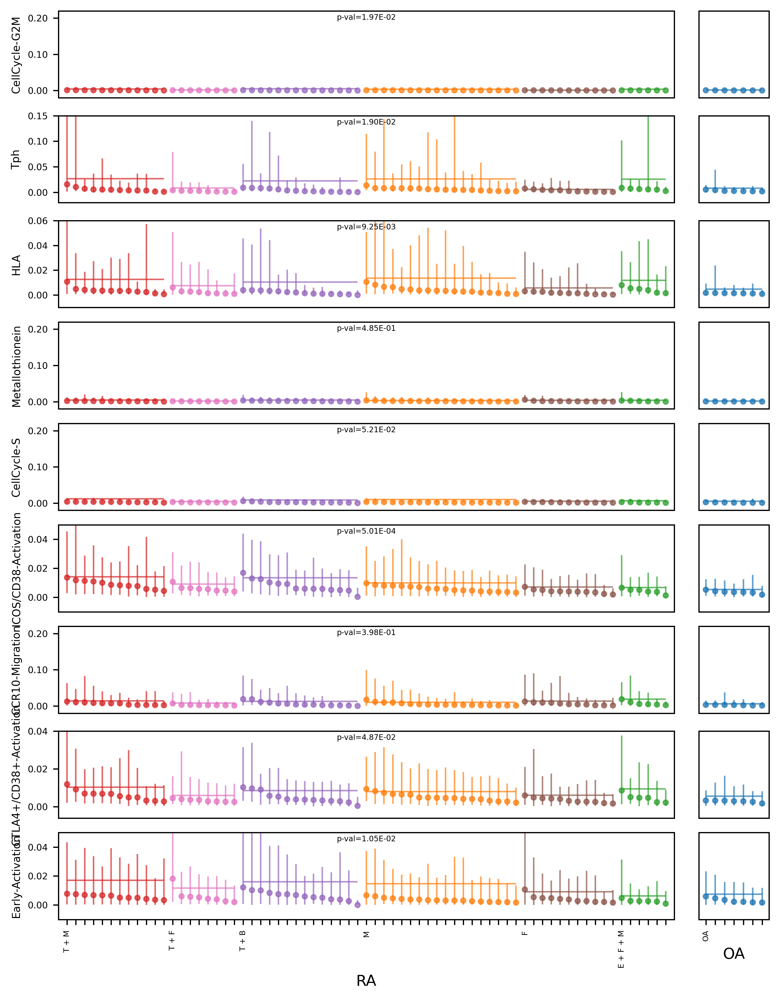

In [972]:
sample_usage_plot(prg_list, pheno_order, pheno, usage_meta_test, individual_col, 
                  cmap, ylim_dict, color_col, pheno_map,
                 height_scalar = 1, figure_width = 7, xticksize = 5, yticksize = 6, 
                  ylabel_fontsize = 7, min_cells = 10, show_pvalue=True)

In [953]:
prg_list

array(['CellCycle-G2M', 'Tph', 'HLA', 'Metallothionein', 'CellCycle-S',
       'ICOS/CD38-Activation', 'CCR10-Migration',
       'CTLA4+/CD38+-Activation', 'Early-Activation'], dtype=object)

In [955]:
prg_name_map = {'ICOS/CD38-Activation' : 'ICOS/CD38-\nActivation',
               'CTLA4+/CD38+-Activation' : 'CTLA4+/CD38\n+-Activation',
               'Early-Activation':'Early-\nActivation'}

In [961]:
ylim_dict = {'Tph': (-0.02, 0.15), 'HLA' : (-0.01, 0.06), 
            'ICOS/CD38-Activation' : (-0.01, 0.05), 
            'CTLA4+/CD38+-Activation' : (-0.006, 0.04),
            'Early-Activation' : (-0.01, 0.05)}

Num samples with <= 10 cells: 1


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:95: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:95: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 1
Num samples with <= 10 cells: 1


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:95: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:95: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 1
Num samples with <= 10 cells: 1


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:95: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:95: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 1
Num samples with <= 10 cells: 1


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:95: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:95: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 1
Num samples with <= 10 cells: 1


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:100: UserWarning: FixedFormatter should only be used together with FixedLocator
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:100: UserWarning: FixedFormatter should only be used together with FixedLocator


Num samples with <= 10 cells: 1


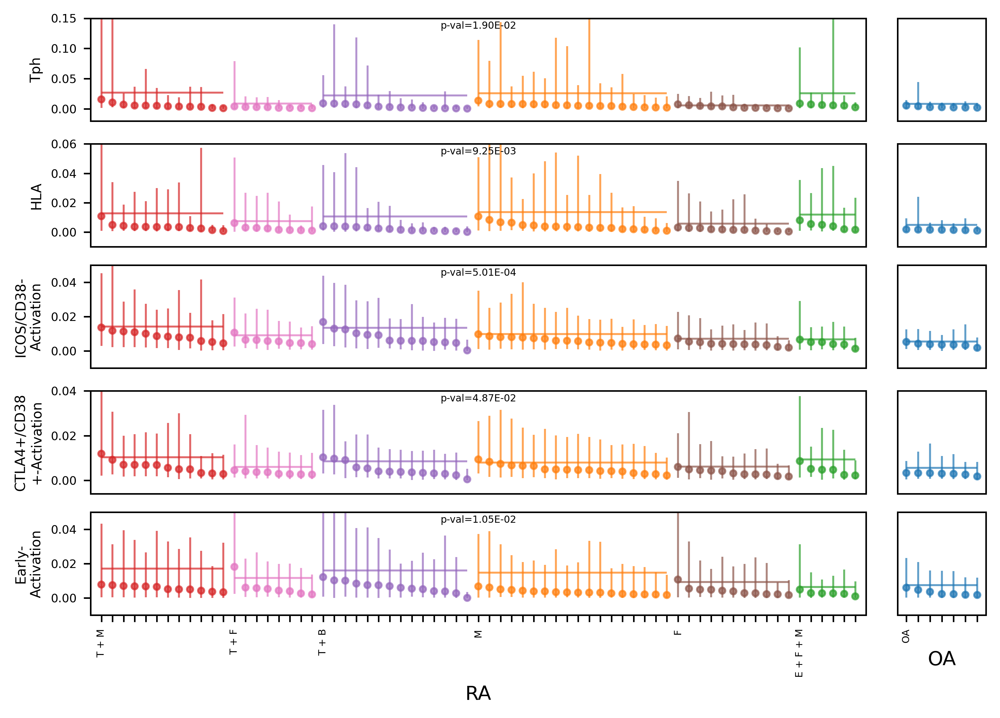

In [975]:
fig = sample_usage_plot(['Tph', 'HLA', 'ICOS/CD38-Activation', 'CTLA4+/CD38+-Activation', 
                   'Early-Activation'], 
                  pheno_order, pheno, usage_meta_test, individual_col, 
                  cmap, ylim_dict, color_col, pheno_map,
                 height_scalar = 1, figure_width = 7, xticksize = 5, yticksize = 6, 
                  ylabel_fontsize = 7, min_cells = 10, show_pvalue=True,
                 prg_names = prg_name_map)
fig.savefig(os.path.join(figdir, 'SamplesByPhenotype.RAOA.png'), bbox_inches="tight")
fig.savefig(os.path.join(figdir, 'SamplesByPhenotype.RAOA.pdf'), bbox_inches="tight")


## Strip plots

In [295]:
# cmap_stripplot = cm.get_cmap('tab10', 10)

# nrows = len(prg_list)
# ncols = 1#len(pheno_order)
# figure_width = 2
# height_scalar = 1.6
# figure_height = height_scalar*len(prg_list)

# pt_size = 2



# fig, axes = plt.subplots(constrained_layout=True,dpi=450, figsize=(figure_width,figure_height),
#                  nrows = nrows, ncols =  ncols) 
# for k, prg in enumerate(prg_list):
#     print(prg)

#     dat = pd.DataFrame()

#     for j, pheno_name in enumerate(pheno_order):
#         pheno_usg = usage_meta_test[usage_meta_test[pheno]== pheno_order[j]]
#         sample_quant_usg = pd.DataFrame(pheno_usg[[prg, sample_col]].groupby(sample_col).quantile(.95))
#         sample_quant_usg[pheno] = pheno_name
#         dat = dat.append(sample_quant_usg.reset_index())
#         dat_mean = dat.groupby(pheno).median()

#     # fig, ax = plt.subplots()
#     ax = axes[k]
#     sns.stripplot(data=dat, x=pheno, y=prg, order = pheno_order, ax = ax, size = pt_size)
#     xlim = ax.get_xlim()

#     for j, pheno_name in enumerate(pheno_order):
#         ax.hlines(y = dat_mean.loc[pheno_name][0], xmin = j-.2, xmax = j+.2, color = cmap_stripplot(j))    

#     ax.set_xlim(xlim)
#     # plt.show()
    
#     if k==(nrows-1):
#         axes[k].set_xlabel(pheno)
#     else:
#         axes[k].set_xlabel('')



In [1010]:
prg_list

array(['CellCycle-G2M', 'Tph', 'HLA', 'Metallothionein', 'CellCycle-S',
       'ICOS/CD38-Activation', 'CCR10-Migration',
       'CTLA4+/CD38+-Activation', 'Early-Activation'], dtype=object)

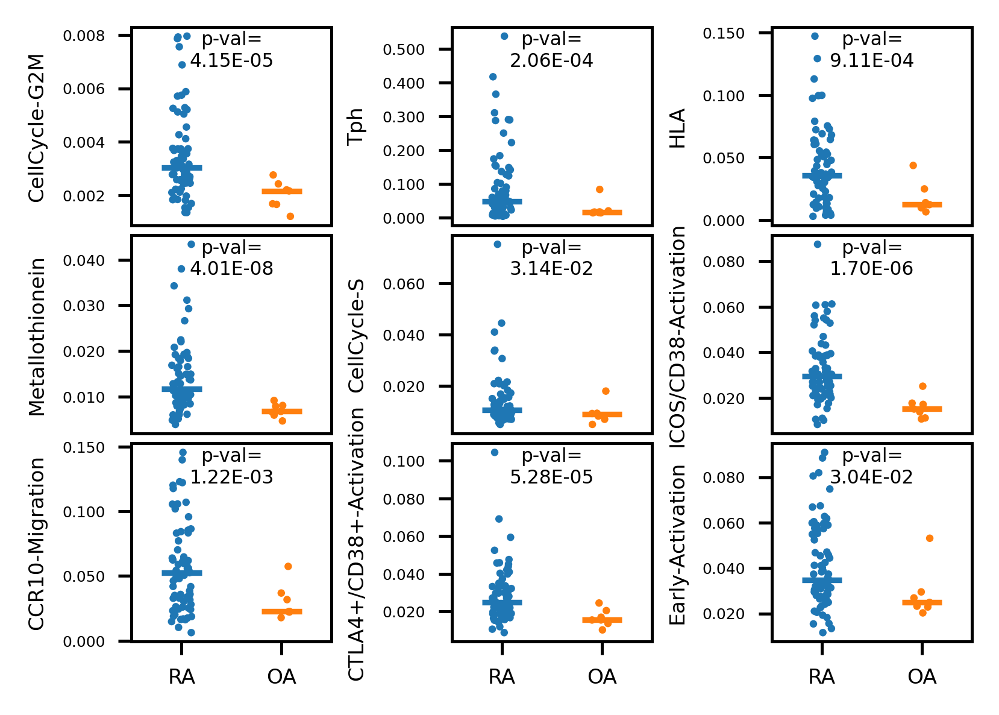

In [1016]:
fig = sample_usage_striplot(prg_list, pheno_order, pheno, usage_meta_test, sample_col, cmap_stripplot, pheno_map,
                      height_scalar = 1, 
                      pt_size = 2, min_cells = 10, show_pvalue = True,
                     titlesize = 8, qntl = 0.95, yticksize=4, labelsize = 5.5, 
                     wspace = 0.6, ncols = 3, width_scalar = 4/3, ranksums_test = False)
# fig.savefig(os.path.join(figdir, 'Stripplot.RAOA.png'), bbox_inches="tight")
# fig.savefig(os.path.join(figdir, 'Stripplot.RAOA.pdf'), bbox_inches="tight")


['CCR10-Migration', 'Tph', 'HLA', 'Early-Activation', 'ICOS/CD38-Activation', 'CTLA4+/CD38+-Activation', 'Metallothionein', 'CellCycle-S', 'CellCycle-G2M']


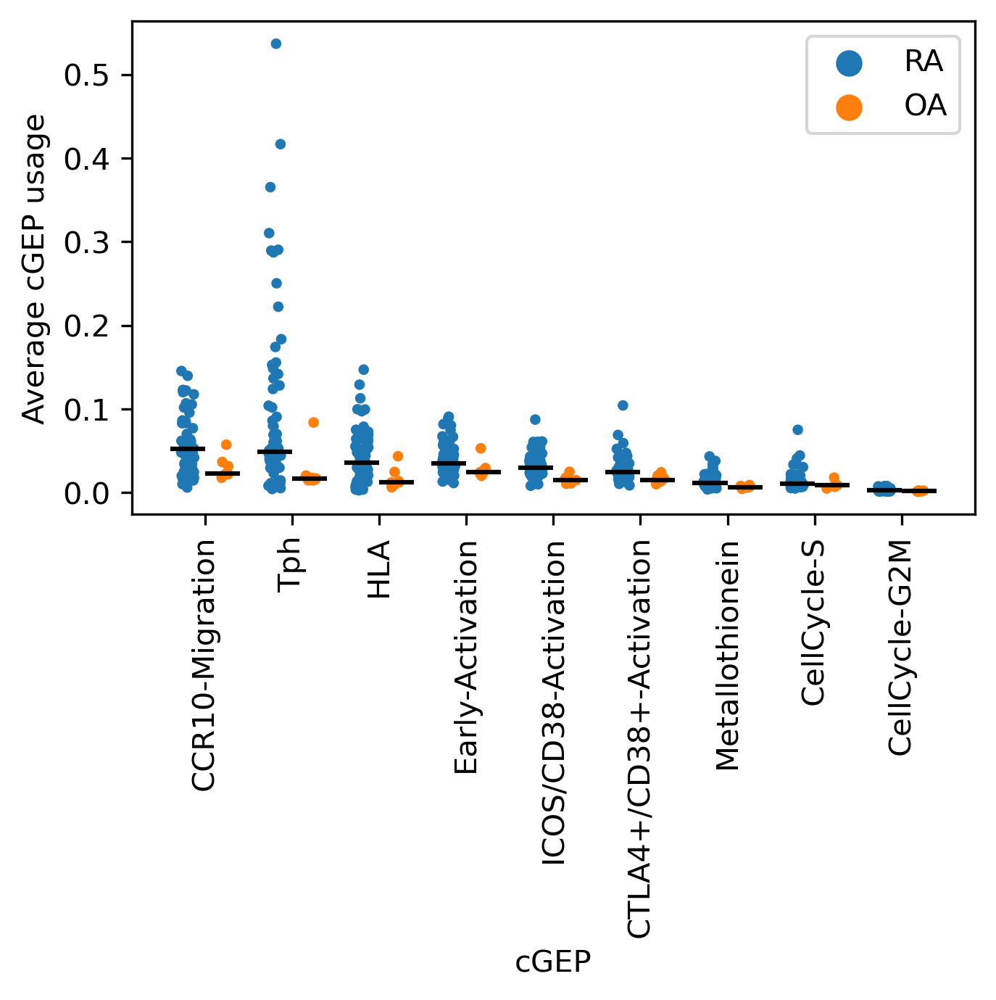

In [1021]:
fig = sample_striplot_combined(prg_list, pheno_order, pheno, usage_meta_test, sample_col, 
                               cmap_stripplot, pheno_map,
                                 min_cells = 10, qntl = 0.95)

In [1023]:
prg_order = [ 'Tph', 'CCR10-Migration','HLA', 'Early-Activation', 
             'ICOS/CD38-Activation', 'CTLA4+/CD38+-Activation', 'Metallothionein', 
             'CellCycle-S', 'CellCycle-G2M']


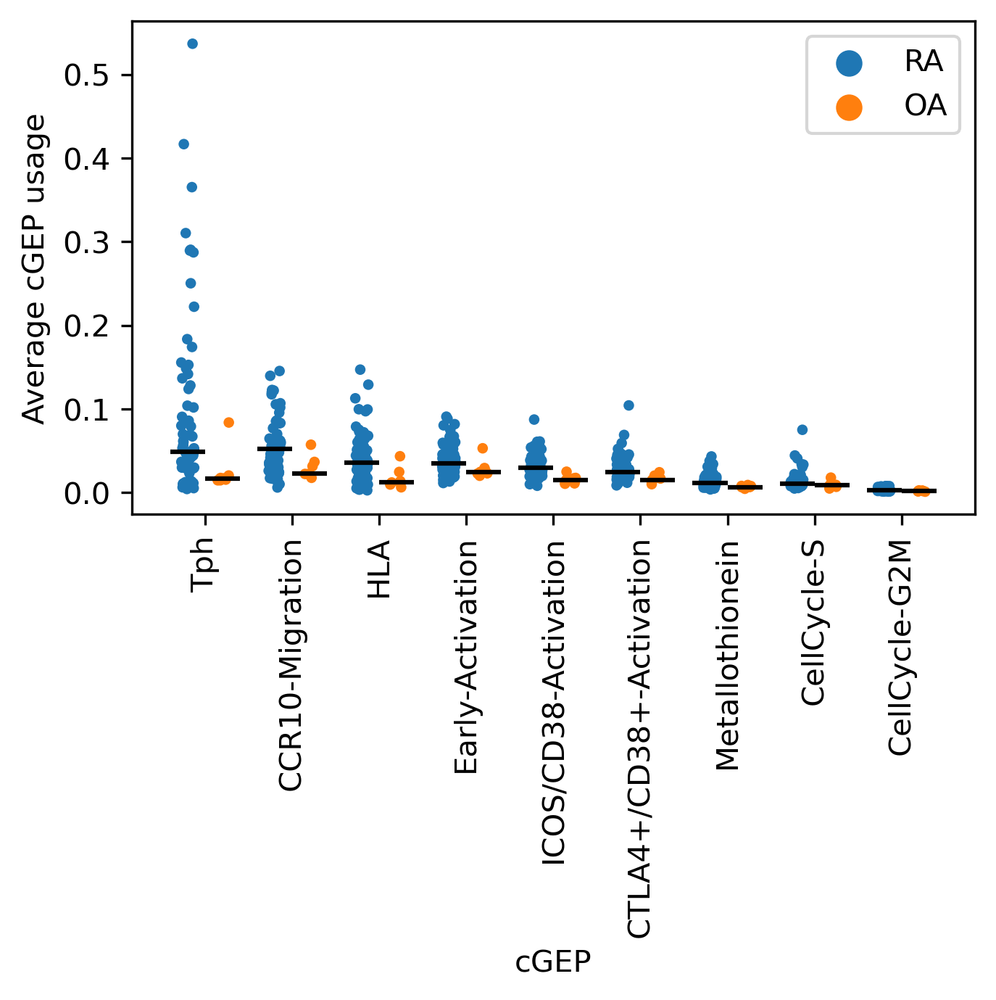

In [1026]:
fig = sample_striplot_combined(prg_list, pheno_order, pheno, usage_meta_test, sample_col, 
                               cmap_stripplot, pheno_map,
                                 min_cells = 10, qntl = 0.95, prg_order = prg_order)
fig.savefig(os.path.join(figdir, 'Stripplot.RAOA.png'), bbox_inches="tight")
fig.savefig(os.path.join(figdir, 'Stripplot.RAOA.pdf'), bbox_inches="tight")

# Pan-Cancer

In [649]:
dataset = 'Pan-Cancer'

In [650]:
# for dataset in pheno_params['dataset'].unique():
sample_col = params.loc[dataset, 'sample_col']
individual_col = params.loc[dataset, 'individual_col']
usage = pd.read_csv(params.loc[dataset, 'tcat_fn'], index_col = 0, sep = '\t')
usage.columns = usage.columns.map(rename_map)

meta = pd.read_csv(params.loc[dataset, 'metadata_fn'].replace('metadata', 'metadata_PhenotypeAssociations'),
                  index_col = 0, sep = '\t')
pheno_params_ds = pheno_params[pheno_params['dataset']==dataset]
res_df_ds = res_df[res_df['dataset']==dataset]

/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3524: DtypeWarning: Columns (7) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [390]:
# # Subset to non-binarized version of column variables 
# for pheno_col in pheno_params_ds['pheno_col_orig']:
    

In [651]:
pheno_cols = pheno_params_ds['pheno_col_orig'].unique()

In [652]:
pheno_cols

array(['loc', 'cancerType'], dtype=object)

In [653]:
usage_meta = usage.merge(meta, left_index = True, right_index = True)
usage_meta = usage_meta.loc[usage.index, ]

# Define mean usage for each phenotype
usage_phenos = pd.DataFrame()
for pheno in pheno_cols:
    with rc_context({'figure.figsize': (4, 4), 'figure.dpi':200}):
        avg_usg = usage.groupby(meta.loc[usage.index, pheno]).mean().T
        usage_phenos = pd.concat([usage_phenos, avg_usg], axis = 1)
        # g = sns.clustermap(avg_usg)
        # plt.show()

usage_meta_test = usage_meta

In [459]:
pheno_cols

array(['loc', 'cancerType'], dtype=object)

In [654]:
pheno = pheno_cols[0]
color_col = pheno_cols[1]

pheno_orders = [usage_meta_test[x].unique() for x in pheno_cols]
pheno_order = pheno_orders[0]

In [461]:
pheno_orders

[array(['T', 'N'], dtype=object),
 array(['BCC', 'BCL', 'BC', 'ESCA', 'FTC', 'HCC', 'LUNG', 'MM', 'OV',
        'PACA', 'RC', 'THCA', 'UCEC'], dtype=object)]

In [655]:
pheno_map = usage_meta[color_col].unique()
pheno_map = dict(zip( pheno_map, range(0, len(pheno_map))))


In [656]:
ylim_dict = {}

In [657]:
prg_list = res_df_ds[res_df_ds['padj']< 0.05].sort_values('log2fc', key = abs, ascending = False)
prg_list = prg_list[prg_list['pheno_col']=='loc']['cGEP'].unique()

In [465]:
prg_list

array(['OX40/EBI3-Activation', 'CellCycle-Late-S', 'CellCycle-S', 'Treg',
       'ISG', 'Exhaustion', 'Doublet-Platelet', 'Th17-2', 'Tph',
       'Cytoskeleton', 'Th2-2', 'HLA', 'TIMD4/TIM3-Acitvation', 'IEG',
       'CTLA4+/CD38+-Activation', 'ICOS/CD38-Activation', 'Mito',
       'CD4-CM', 'CD40LG/TXNIP-Associated', 'CD4-EM', 'gdT-Blood'],
      dtype=object)

In [194]:
res_df_ds[res_df_ds['padj']< 0.05].sort_values('log2fc', key = abs, ascending = False)

,dataset,cGEP,t-stat,pval,padj,fold_change,pheno_col_orig,pheno_col,phenotypes,type,log2fc
1138,Pan-Cancer,Doublet-Fibroblast,4.639377,0.000013,0.000689,28.720656,cancerType,cancerType_Binary_UCEC,"Other,UCEC",unpaired,4.844017
566,Pan-Cancer,Doublet-Fibroblast,4.579155,0.000015,0.000786,26.493696,cancerType,cancerType_Binary_BCL,"Other,BCL",unpaired,4.727577
670,Pan-Cancer,Doublet-Fibroblast,4.610031,0.000014,0.000750,25.976093,cancerType,cancerType_Binary_ESCA,"Other,ESCA",unpaired,4.699113
1086,Pan-Cancer,Doublet-Fibroblast,4.594140,0.000016,0.000830,22.696242,cancerType,cancerType_Binary_THCA,"Other,THCA",unpaired,4.504382
982,Pan-Cancer,Doublet-Fibroblast,-5.616623,0.000009,0.000446,0.046018,cancerType,cancerType_Binary_PACA,"Other,PACA",unpaired,-4.441660
...,...,...,...,...,...,...,...,...,...,...,...
844,Pan-Cancer,MAIT,4.010860,0.000143,0.007411,1.516332,cancerType,cancerType_Binary_MM,"Other,MM",unpaired,0.600586
384,Pan-Cancer,CD4-CM,3.714088,0.000583,0.030321,1.465628,loc,loc,"T,N",paired,0.551519
454,Pan-Cancer,CD4-EM,-3.699401,0.000383,0.019923,0.718996,loc,loc,"T,N",unpaired,-0.475944
422,Pan-Cancer,gdT-Blood,-3.926963,0.000161,0.008380,0.736151,loc,loc,"T,N",unpaired,-0.441926


In [658]:
cmap = cm.get_cmap('tab20', 20)

In [286]:
# pheno_label = [{'P':'PBMC', 'N': 'NAT', 'T':'Tumor'}, {}]


In [287]:
pheno, pheno_order

('loc', array(['T', 'N'], dtype=object))

In [288]:
pheno_order

array(['T', 'N'], dtype=object)

/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:79: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:79: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:79: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:79: MatplotlibDeprecationWarning: Suppor

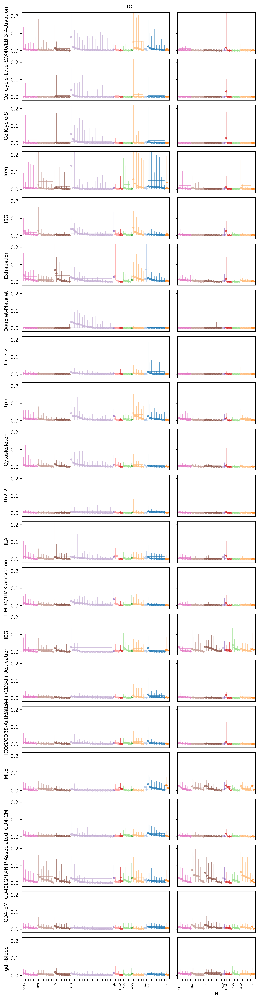

In [198]:
sample_usage_plot(prg_list, pheno_order, pheno, usage_meta_test, individual_col, 
                  cmap, ylim_dict, color_col, pheno_map, 
                 height_scalar = 1.3, figure_width = 7, xticksize = 5)

In [ ]:
pheno_order

In [659]:
ylim_dict = {'Exhaustion' : (-0.02, 0.2), 'OX40/EBI3-Activation': (-0.02, 0.3),
            'Th17-2' : (-0.02, 0.1)}

In [660]:
prg_list = ['Exhaustion', 'OX40/EBI3-Activation', 'Th17-2']

In [661]:
pheno_label = {'N': 'Normal', 'T':'Tumor'}

Num samples with <= 10 cells: 2


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:86: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 3


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:86: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 2


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:86: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 3


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:86: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 2


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:91: UserWarning: FixedFormatter should only be used together with FixedLocator


Num samples with <= 10 cells: 3


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:91: UserWarning: FixedFormatter should only be used together with FixedLocator


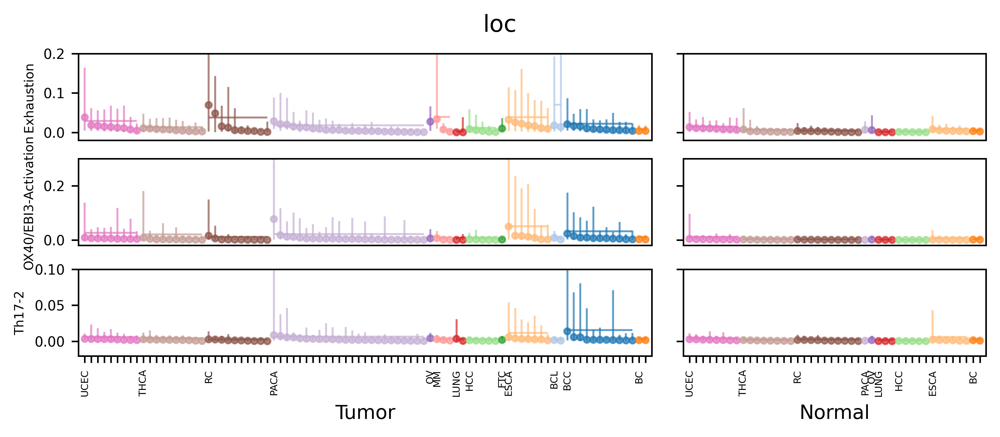

In [470]:
sample_usage_plot(prg_list, pheno_order, pheno, usage_meta_test, individual_col, 
                  cmap, ylim_dict, color_col, pheno_map, pheno_label = pheno_label,
                 height_scalar = 1, figure_width = 7, xticksize = 5, yticksize = 7, 
                 ylabel_fontsize = 6.5, min_cells = 10)

## Strip plots

In [295]:
# cmap_stripplot = cm.get_cmap('tab10', 10)

# nrows = len(prg_list)
# ncols = 1#len(pheno_order)
# figure_width = 2
# height_scalar = 1.6
# figure_height = height_scalar*len(prg_list)

# pt_size = 2

# fig, axes = plt.subplots(constrained_layout=True,dpi=450, figsize=(figure_width,figure_height),
#                  nrows = nrows, ncols =  ncols) 
# for k, prg in enumerate(prg_list):
#     print(prg)

#     dat = pd.DataFrame()

#     for j, pheno_name in enumerate(pheno_order):
#         pheno_usg = usage_meta_test[usage_meta_test[pheno]== pheno_order[j]]
#         sample_quant_usg = pd.DataFrame(pheno_usg[[prg, sample_col]].groupby(sample_col).quantile(.95))
#         sample_quant_usg[pheno] = pheno_name
#         dat = dat.append(sample_quant_usg.reset_index())
#         dat_mean = dat.groupby(pheno).median()

#     # fig, ax = plt.subplots()
#     ax = axes[k]
#     sns.stripplot(data=dat, x=pheno, y=prg, order = pheno_order, ax = ax, size = pt_size)
#     xlim = ax.get_xlim()

#     for j, pheno_name in enumerate(pheno_order):
#         ax.hlines(y = dat_mean.loc[pheno_name][0], xmin = j-.2, xmax = j+.2, color = cmap_stripplot(j))    

#     ax.set_xlim(xlim)
#     # plt.show()
    
#     if k==(nrows-1):
#         axes[k].set_xlabel(pheno)
#     else:
#         axes[k].set_xlabel('')



Exhaustion
OX40/EBI3-Activation
Th17-2


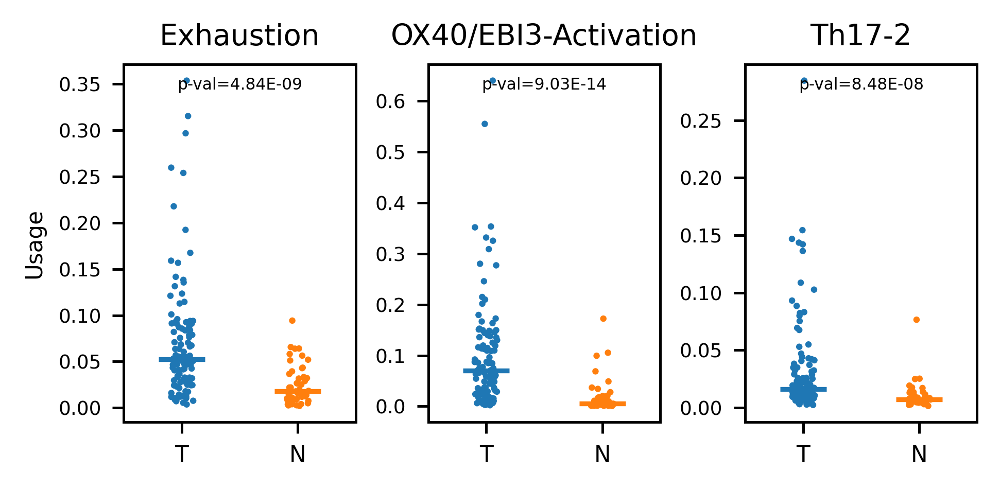

In [662]:
sample_usage_striplot(prg_list, pheno_order, pheno, usage_meta_test, sample_col, cmap_stripplot, pheno_map,
                     figure_height = 2, width_scalar = 1.4, pt_size = 2, min_cells = 10, show_pvalue = True)

Exhaustion
OX40/EBI3-Activation
Th17-2
2


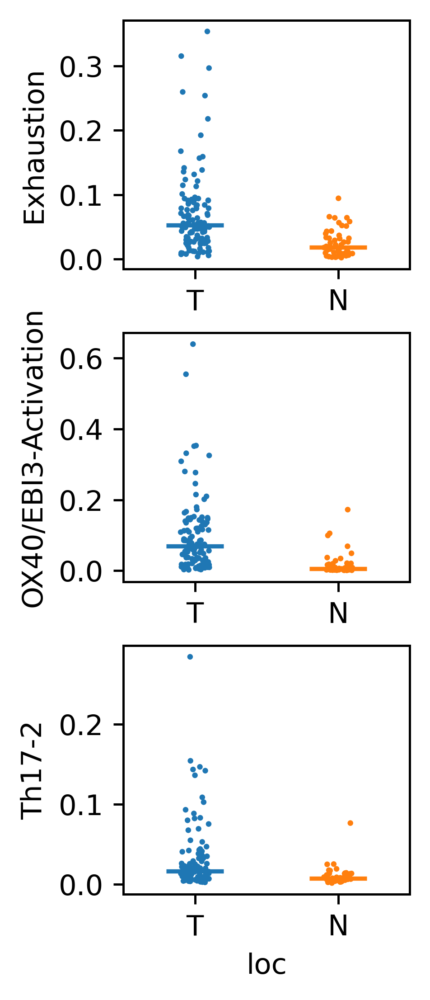

In [472]:
# sample_usage_striplot(prg_list, pheno_order, pheno, usage_meta_test, sample_col, cmap_stripplot, pheno_map,
#                      figure_width = 2, height_scalar = 1.6, pt_size = 2, min_cells = 10)

# UK-Covid

In [15]:
dataset = 'UK-Covid'

In [16]:
# for dataset in pheno_params['dataset'].unique():
sample_col = params.loc[dataset, 'sample_col']
individual_col = params.loc[dataset, 'individual_col']
usage = pd.read_csv(params.loc[dataset, 'tcat_fn'], index_col = 0, sep = '\t')
usage.columns = usage.columns.map(rename_map)

meta = pd.read_csv(params.loc[dataset, 'metadata_fn'].replace('metadata', 'metadata_PhenotypeAssociations'),
                  index_col = 0, sep = '\t')
pheno_params_ds = pheno_params[pheno_params['dataset']==dataset]
res_df_ds = res_df[res_df['dataset']==dataset]

/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3524: DtypeWarning: Columns (18,20,21) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [17]:
pheno_cols = pheno_params_ds['pheno_col_orig'].unique()

In [18]:
usage_meta = usage.merge(meta, left_index = True, right_index = True)
usage_meta = usage_meta.loc[usage.index, ]

# Define mean usage for each phenotype
usage_phenos = pd.DataFrame()
for pheno in pheno_cols:
    with rc_context({'figure.figsize': (4, 4), 'figure.dpi':200}):
        avg_usg = usage.groupby(meta.loc[usage.index, pheno]).mean().T
        usage_phenos = pd.concat([usage_phenos, avg_usg], axis = 1)
        # g = sns.clustermap(avg_usg)
        # plt.show()


In [19]:
pheno_cols

array(['Overall_Status', 'CovidStatus_Binary_Critical'], dtype=object)

In [1052]:
pheno = pheno_cols[0]
color_col = 'Status_on_day_collection_summary'#pheno_cols[0]



In [1053]:
usage_meta_test = usage_meta.loc[usage_meta[pheno].dropna().index, ]

In [1054]:
pheno_orders = [usage_meta_test[x].unique() for x in pheno_cols]
pheno_order = pheno_orders[0]

In [1055]:
pheno_orders

[array(['Covid', 'Healthy_All'], dtype=object),
 array(['Other', nan, 'Critical'], dtype=object)]

In [1056]:
pheno_map = usage_meta[color_col].unique()
pheno_map = dict(zip( pheno_map, range(0, len(pheno_map))))


In [1037]:
ylim_dict = {}

In [1057]:
prg_list = res_df_ds[res_df_ds['padj']< 0.05].sort_values('log2fc', key = abs, ascending = False)
prg_list = prg_list[prg_list['pheno_col']==pheno]['cGEP'].unique()

In [1058]:
prg_list

array(['ISG', 'Mito', 'Translation', 'TXNIP/H1FX', 'CellCycle-G2M',
       'MAIT', 'CellCycle-Late-S', 'CD4-EM', 'CellCycle-S', 'Exhaustion',
       'TIMD4/TIM3-Acitvation', 'Tph', 'Doublet-Fibroblast'], dtype=object)

In [255]:
res_df_ds[res_df_ds['padj']< 0.05].sort_values('log2fc', key = abs, ascending = False)

,dataset,cGEP,t-stat,pval,padj,fold_change,pheno_col_orig,pheno_col,phenotypes,type,log2fc
1147,UK-Covid,ISG,5.880535,8.291304e-08,4.311478e-06,4.041483,Overall_Status,Overall_Status,"Covid,Healthy_All",unpaired,2.014885
1148,UK-Covid,Mito,-6.526852,1.109659e-06,5.770226e-05,0.316587,Overall_Status,Overall_Status,"Covid,Healthy_All",unpaired,-1.659324
1145,UK-Covid,Translation,-5.884112,1.601758e-06,8.329140e-05,0.384702,Overall_Status,Overall_Status,"Covid,Healthy_All",unpaired,-1.378188
1199,UK-Covid,ISG,4.157384,8.294050e-05,4.312906e-03,2.452166,CovidStatus_Binary_Critical,CovidStatus_Binary_Critical,"Other,Critical",unpaired,1.294057
1188,UK-Covid,TXNIP/H1FX,-4.765742,5.350994e-05,2.782517e-03,0.466419,Overall_Status,Overall_Status,"Covid,Healthy_All",unpaired,-1.100303
1144,UK-Covid,CellCycle-G2M,5.369791,5.424166e-07,2.820566e-05,2.045174,Overall_Status,Overall_Status,"Covid,Healthy_All",unpaired,1.032223
1156,UK-Covid,MAIT,-3.997512,4.744319e-04,2.467046e-02,0.491429,Overall_Status,Overall_Status,"Covid,Healthy_All",unpaired,-1.024946
1157,UK-Covid,CellCycle-Late-S,5.297712,7.243186e-07,3.766457e-05,1.872161,Overall_Status,Overall_Status,"Covid,Healthy_All",unpaired,0.904705
1182,UK-Covid,CD4-EM,-5.779247,2.721564e-06,1.415213e-04,0.552412,Overall_Status,Overall_Status,"Covid,Healthy_All",unpaired,-0.856182
1151,UK-Covid,CellCycle-S,5.409981,5.187982e-07,2.697750e-05,1.744198,Overall_Status,Overall_Status,"Covid,Healthy_All",unpaired,0.802564


In [676]:
cmap = cm.get_cmap('tab10', 10)

In [ ]:
# pheno_label = [{'P':'PBMC', 'N': 'NAT', 'T':'Tumor'}, {}]


In [257]:
pheno, pheno_order

('Overall_Status', array(['Covid', 'Healthy_All'], dtype=object))

In [1060]:
usage.columns

Index(['CellCycle-G2M', 'Translation', 'HLA', 'ISG', 'Mito', 'Doublet-RBC',
       'gdT-Blood', 'CellCycle-S', 'Cytotoxic', 'Doublet-Platelet',
       'Early-Activation', 'CCR10-Migration', 'MAIT', 'CellCycle-Late-S',
       'Cytoskeleton', 'HeatShock', 'Multi-Cytokine', 'NK-like',
       'Doublet-Myeloid', 'Metallothionein', 'CD4-CM', 'IEG', 'CD8-EM', 'IEG2',
       'CD4-Naive', 'Treg', 'Th17', 'MALAT1', 'CD8-Naive', 'RGCC/MYADM',
       'TIMD4/TIM3-Activation', 'Doublet-Plasmablast', 'BCL2-Survival',
       'IL10/IL19-Secretion', 'Th2-2', 'Th2-1', 'ICOS/CD38-Activation',
       'Doublet-Bcell', 'CD4-EM', 'CTLA4+/CD38+-Activation', 'CD8-Trm-Like',
       'Th17-2', 'Tfh-2', 'OX40/EBI3-Activation', 'TXNIP/H1FX', 'YPEL5/JUNB',
       'Doublet-Fibroblast', 'SOX4/TOX2', 'CD40LG/TXNIP', 'Tph', 'Exhaustion',
       'Tfh-1'],
      dtype='object')

In [1059]:
prg_list

array(['ISG', 'Mito', 'Translation', 'TXNIP/H1FX', 'CellCycle-G2M',
       'MAIT', 'CellCycle-Late-S', 'CD4-EM', 'CellCycle-S', 'Exhaustion',
       'TIMD4/TIM3-Acitvation', 'Tph', 'Doublet-Fibroblast'], dtype=object)

In [1062]:
prg_list = ['ISG', 'Mito', 'Translation', 'TXNIP/H1FX', 'CellCycle-G2M',
       'MAIT', 'CellCycle-Late-S', 'CD4-EM', 'CellCycle-S', 'Exhaustion',
       'TIMD4/TIM3-Activation', 'Tph', 'Doublet-Fibroblast']

Num samples with <= 0 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 0 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 0 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 0 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 0 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 0 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 0 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 0 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 0 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 0 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 0 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 0 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 0 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 0 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 0 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 0 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 0 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 0 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 0 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 0 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 0 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 0 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 0 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 0 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 0 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:102: UserWarning: FixedFormatter should only be used together with FixedLocator


Num samples with <= 0 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:102: UserWarning: FixedFormatter should only be used together with FixedLocator


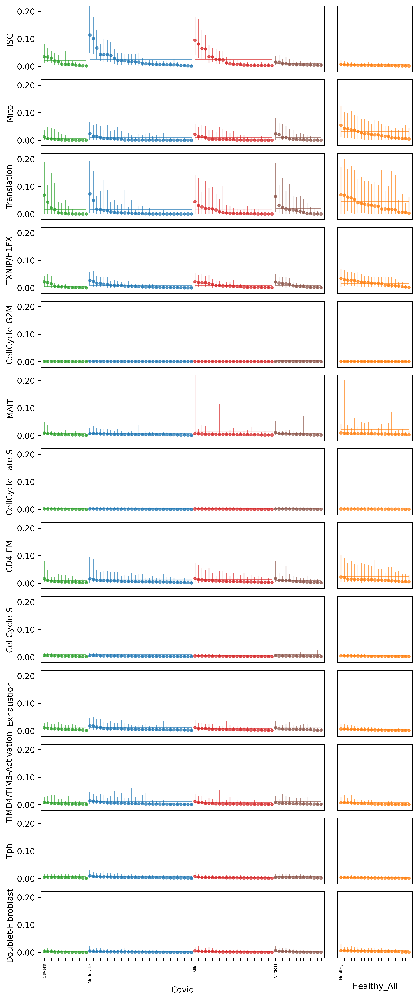

In [1063]:
fig = sample_usage_plot(prg_list, pheno_order, pheno, usage_meta_test, individual_col, 
                  cmap, ylim_dict, color_col, pheno_map, 
                 height_scalar = 1.3, figure_width = 7, xticksize = 5)

In [260]:
prg_list

array(['ISG', 'Mito', 'Translation', 'TXNIP/H1FX', 'CellCycle-G2M',
       'MAIT', 'CellCycle-Late-S', 'CD4-EM', 'CellCycle-S', 'Exhaustion',
       'TIMD4/TIM3-Acitvation', 'Tph', 'Doublet-Fibroblast'], dtype=object)

In [1064]:
prg_list = ['ISG', 'TIMD4/TIM3-Activation', 'Exhaustion', 'Tph']

In [1072]:
ylim_dict = {'ISG': (-0.02, 0.2), 'TIMD4/TIM3-Activation' : (-0.01, 0.06),
            'Exhaustion' : (-0.01, 0.055), 'Tph':(-0.01, 0.03)}

In [1066]:
pheno_label = {'Covid': 'Covid', 'Healthy_All':'Healthy'}

In [1067]:
pheno_order

array(['Covid', 'Healthy_All'], dtype=object)

Num samples with <= 10 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:102: UserWarning: FixedFormatter should only be used together with FixedLocator


Num samples with <= 10 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:102: UserWarning: FixedFormatter should only be used together with FixedLocator


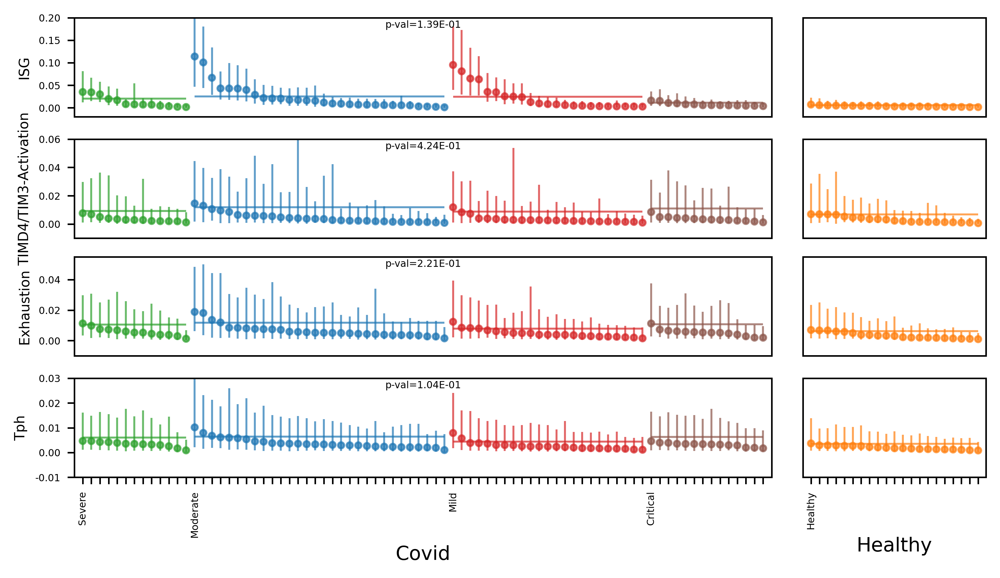

In [1073]:
fig = sample_usage_plot(prg_list, pheno_order, pheno, usage_meta_test, individual_col, 
                  cmap, ylim_dict, color_col, pheno_map, pheno_label = pheno_label,
                 height_scalar = 1, figure_width = 7, xticksize = 5, yticksize = 5, 
                  ylabel_fontsize = 7, min_cells = 10, show_pvalue = True)

In [1078]:
prg_list= ['ISG', 'TIMD4/TIM3-Activation', 'Exhaustion']

In [1110]:
cmap = cm.get_cmap('tab10', 10)

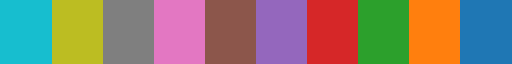

In [1076]:
cmap

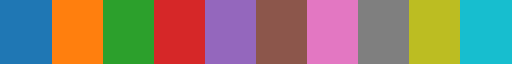

In [1098]:
cm.get_cmap('tab10', 10)

In [1100]:
cmap.colors

array([[0.09019608, 0.74509804, 0.81176471, 1.        ],
       [0.7372549 , 0.74117647, 0.13333333, 1.        ],
       [0.49803922, 0.49803922, 0.49803922, 1.        ],
       [0.89019608, 0.46666667, 0.76078431, 1.        ],
       [0.54901961, 0.3372549 , 0.29411765, 1.        ],
       [0.58039216, 0.40392157, 0.74117647, 1.        ],
       [0.83921569, 0.15294118, 0.15686275, 1.        ],
       [0.17254902, 0.62745098, 0.17254902, 1.        ],
       [1.        , 0.49803922, 0.05490196, 1.        ],
       [0.12156863, 0.46666667, 0.70588235, 1.        ]])

In [1111]:
from matplotlib.colors import LinearSegmentedColormap

In [1117]:
i_filt = [0, 1, 5, 7]
colors = [color for i, color in enumerate(cmap.colors) if i not in i_filt]

In [1118]:
colors

[array([0.17254902, 0.62745098, 0.17254902, 1.        ]),
 array([0.83921569, 0.15294118, 0.15686275, 1.        ]),
 array([0.58039216, 0.40392157, 0.74117647, 1.        ]),
 array([0.89019608, 0.46666667, 0.76078431, 1.        ]),
 array([0.7372549 , 0.74117647, 0.13333333, 1.        ]),
 array([0.09019608, 0.74509804, 0.81176471, 1.        ])]

In [1121]:
cmap_filt = LinearSegmentedColormap.from_list("mycmap", colors, N = len(colors))


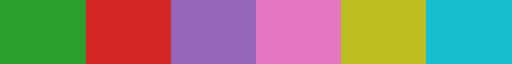

In [1122]:
cmap_filt

Num samples with <= 10 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:102: UserWarning: FixedFormatter should only be used together with FixedLocator


Num samples with <= 10 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:102: UserWarning: FixedFormatter should only be used together with FixedLocator


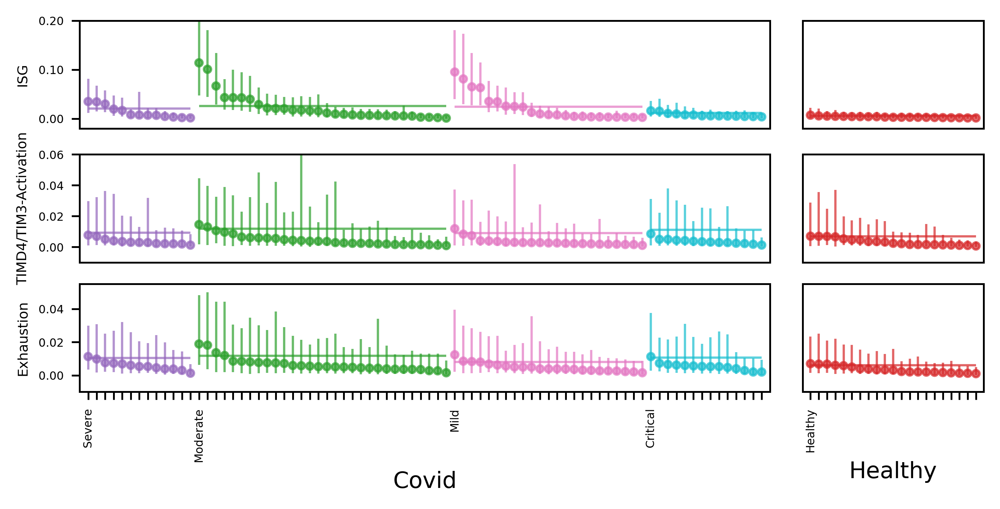

In [1128]:
fig = sample_usage_plot(prg_list, pheno_order, pheno, usage_meta_test, individual_col, 
                  cmap_filt, ylim_dict, color_col, pheno_map, pheno_label = pheno_label,
                 height_scalar = 1, figure_width = 6, xticksize = 5, yticksize = 5, 
                  ylabel_fontsize = 6, min_cells = 10)

fig.savefig(os.path.join(figdir, 'SamplesByPhenotype.UKCovid.png'), bbox_inches="tight")
fig.savefig(os.path.join(figdir, 'SamplesByPhenotype.UKCovid.pdf'), bbox_inches="tight")


## Strip plots

In [311]:
# cmap_stripplot = cm.get_cmap('tab10', 10)

# nrows = len(prg_list)
# ncols = 1#len(pheno_order)
# figure_width = 2
# height_scalar = 1.6
# figure_height = height_scalar*len(prg_list)

# pt_size = 2

# fig, axes = plt.subplots(constrained_layout=True,dpi=450, figsize=(figure_width,figure_height),
#                  nrows = nrows, ncols =  ncols) 
# for k, prg in enumerate(prg_list):
#     print(prg)

#     dat = pd.DataFrame()

#     for j, pheno_name in enumerate(pheno_order):
#         pheno_usg = usage_meta_test[usage_meta_test[pheno]== pheno_order[j]]
#         sample_quant_usg = pd.DataFrame(pheno_usg[[prg, sample_col]].groupby(sample_col).quantile(.95))
#         sample_quant_usg[pheno] = pheno_name
#         dat = dat.append(sample_quant_usg.reset_index())
#         dat_mean = dat.groupby(pheno).median()

#     # fig, ax = plt.subplots()
#     ax = axes[k]
#     sns.stripplot(data=dat, x=pheno, y=prg, order = pheno_order, ax = ax, size = pt_size)
#     xlim = ax.get_xlim()

#     for j, pheno_name in enumerate(pheno_order):
#         ax.hlines(y = dat_mean.loc[pheno_name][0], xmin = j-.2, xmax = j+.2, color = cmap_stripplot(j))    

#     ax.set_xlim(xlim)
#     # plt.show()
    
#     if k==(nrows-1):
#         axes[k].set_xlabel(pheno)
#     else:
#         axes[k].set_xlabel('')



ISG
TIMD4/TIM3-Acitvation
Exhaustion


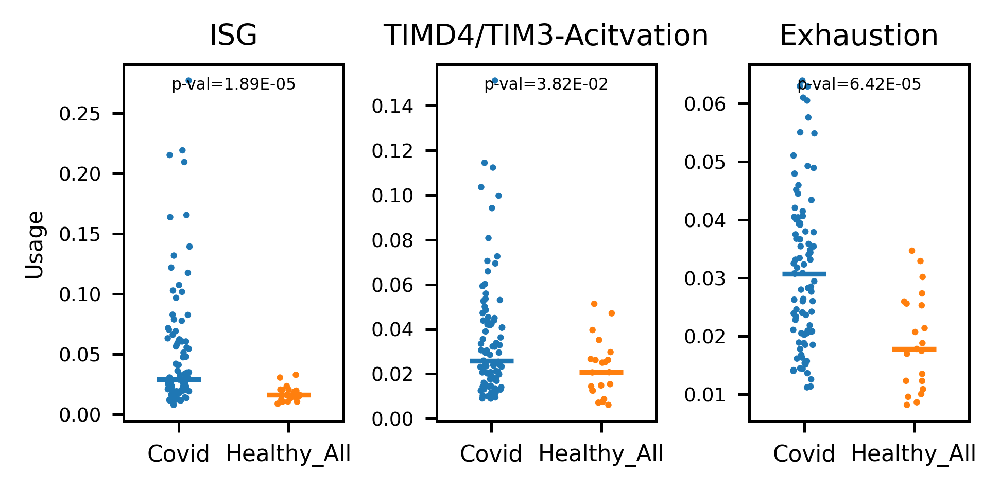

In [681]:
sample_usage_striplot(prg_list, pheno_order, pheno, usage_meta_test, sample_col, cmap_stripplot, pheno_map,
                     figure_height = 2, width_scalar = 1.4, pt_size = 2, min_cells = 10, show_pvalue = True)

ISG
TIMD4/TIM3-Acitvation
Exhaustion
2


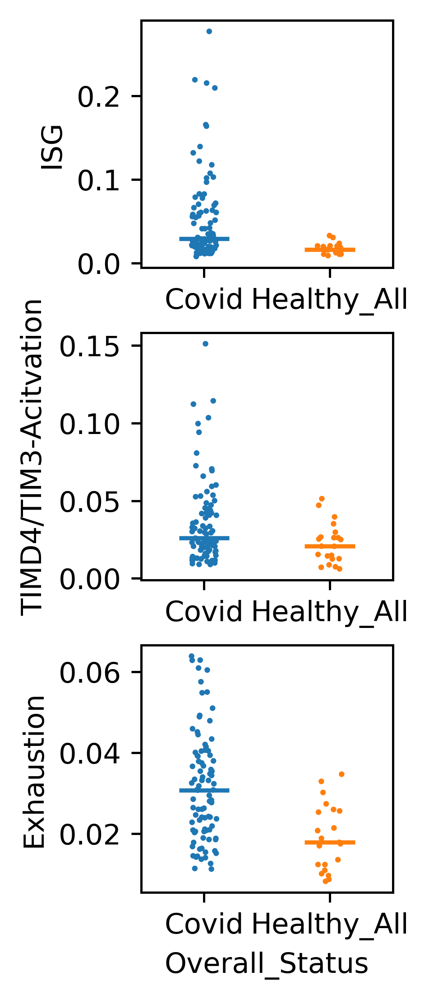

In [490]:
# sample_usage_striplot(prg_list, pheno_order, pheno, usage_meta_test, sample_col, cmap_stripplot, pheno_map,
#                      figure_width = 2, height_scalar = 1.6, pt_size = 2, min_cells = 10)

In [20]:
pheno_cols

array(['Overall_Status', 'CovidStatus_Binary_Critical'], dtype=object)

In [33]:
pheno = pheno_cols[1]
color_col = 'CovidStatus_Binary_Critical'#pheno_cols[0]



In [22]:
usage_meta_test = usage_meta.loc[usage_meta[pheno].dropna().index, ]

In [34]:
pheno_map = usage_meta[color_col].unique()
pheno_map = dict(zip( pheno_map, range(0, len(pheno_map))))


In [38]:
pheno_orders = [usage_meta_test[x].unique() for x in pheno_cols]
pheno_order = pheno_orders[1]

In [24]:
pheno_orders

[array(['Covid'], dtype=object), array(['Other', 'Critical'], dtype=object)]

In [ ]:
# ylim_dict = {}

In [26]:
prg_list = res_df_ds[res_df_ds['padj']< 0.05].sort_values('log2fc', key = abs, ascending = False)
prg_list = prg_list[prg_list['pheno_col']==pheno]['cGEP'].unique()

In [27]:
prg_list

array(['ISG'], dtype=object)

In [28]:
res_df_ds[res_df_ds['padj']< 0.05].sort_values('log2fc', key = abs, ascending = False)

,dataset,cGEP,t-stat,pval,padj,fold_change,pheno_col_orig,pheno_col,phenotypes,type,log2fc
1147,UK-Covid,ISG,5.880535,8.291304e-08,4.311478e-06,4.041483,Overall_Status,Overall_Status,"Covid,Healthy_All",unpaired,2.014885
1148,UK-Covid,Mito,-6.526852,1.109659e-06,5.770226e-05,0.316587,Overall_Status,Overall_Status,"Covid,Healthy_All",unpaired,-1.659324
1145,UK-Covid,Translation,-5.884112,1.601758e-06,8.329140e-05,0.384702,Overall_Status,Overall_Status,"Covid,Healthy_All",unpaired,-1.378188
1199,UK-Covid,ISG,4.157384,8.294050e-05,4.312906e-03,2.452166,CovidStatus_Binary_Critical,CovidStatus_Binary_Critical,"Other,Critical",unpaired,1.294057
1188,UK-Covid,TXNIP/H1FX,-4.765742,5.350994e-05,2.782517e-03,0.466419,Overall_Status,Overall_Status,"Covid,Healthy_All",unpaired,-1.100303
1144,UK-Covid,CellCycle-G2M,5.369791,5.424166e-07,2.820566e-05,2.045174,Overall_Status,Overall_Status,"Covid,Healthy_All",unpaired,1.032223
1156,UK-Covid,MAIT,-3.997512,4.744319e-04,2.467046e-02,0.491429,Overall_Status,Overall_Status,"Covid,Healthy_All",unpaired,-1.024946
1157,UK-Covid,CellCycle-Late-S,5.297712,7.243186e-07,3.766457e-05,1.872161,Overall_Status,Overall_Status,"Covid,Healthy_All",unpaired,0.904705
1182,UK-Covid,CD4-EM,-5.779247,2.721564e-06,1.415213e-04,0.552412,Overall_Status,Overall_Status,"Covid,Healthy_All",unpaired,-0.856182
1151,UK-Covid,CellCycle-S,5.409981,5.187982e-07,2.697750e-05,1.744198,Overall_Status,Overall_Status,"Covid,Healthy_All",unpaired,0.802564


In [31]:
cmap_stripplot = cm.get_cmap('tab10', 10)


In [36]:
sample_col

'sample_id'

In [40]:
pheno_order

array(['Other', 'Critical'], dtype=object)

In [41]:
pheno_order = ['Critical', 'Other']

Critical


,sample_id,ISG,CovidStatus_Binary_Critical
0,AP12,0.051216,Critical
1,AP2,0.028521,Critical
2,BGCV03_CV0200,0.021056,Critical
3,BGCV05_CV0284,0.022905,Critical
4,BGCV06_CV0201,0.011689,Critical


Other


,sample_id,ISG,CovidStatus_Binary_Critical
0,AP12,0.051216,Critical
1,AP2,0.028521,Critical
2,BGCV03_CV0200,0.021056,Critical
3,BGCV05_CV0284,0.022905,Critical
4,BGCV06_CV0201,0.011689,Critical


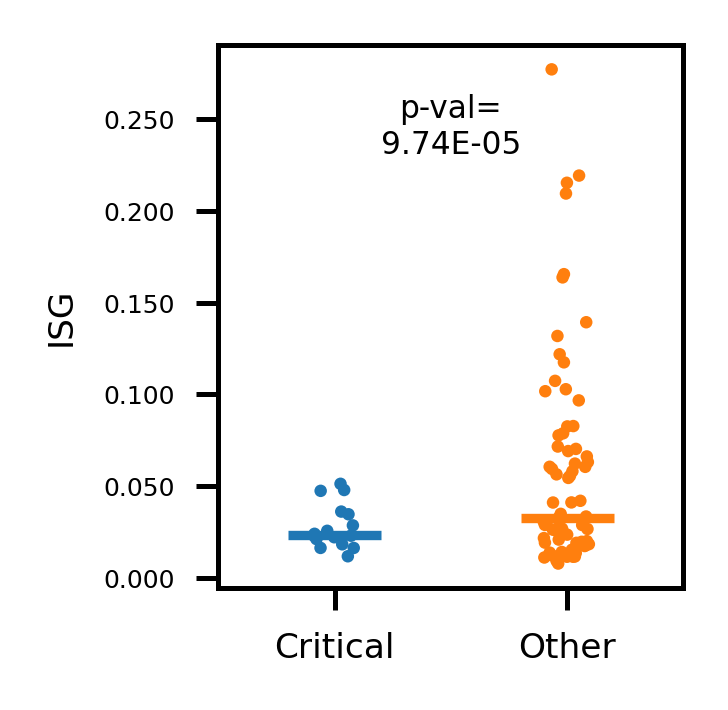

In [58]:
fig = sample_usage_striplot(prg_list, pheno_order, pheno, usage_meta_test, sample_col, cmap_stripplot, pheno_map,
                      height_scalar = 1.6, 
                      pt_size = 2, min_cells = 10, show_pvalue = True,
                     titlesize = 8, qntl = 0.95, yticksize=4, labelsize = 5.5, 
                     wspace = 0.6, ncols = 1, width_scalar = 4/3, ranksums_test = False)
fig.savefig(os.path.join(figdir, 'Stripplot.CriticalOtherCovid.UKCovid.png'), bbox_inches="tight")
fig.savefig(os.path.join(figdir, 'Stripplot.CriticalOtherCovid.UKCovid.pdf'), bbox_inches="tight")


Critical


,sample_id,ISG,CovidStatus_Binary_Critical
0,AP12,0.020144,Critical
1,AP2,0.010360,Critical
2,BGCV03_CV0200,0.007718,Critical
3,BGCV05_CV0284,0.008759,Critical
4,BGCV06_CV0201,0.006127,Critical


Other


,sample_id,ISG,CovidStatus_Binary_Critical
0,AP12,0.020144,Critical
1,AP2,0.010360,Critical
2,BGCV03_CV0200,0.007718,Critical
3,BGCV05_CV0284,0.008759,Critical
4,BGCV06_CV0201,0.006127,Critical


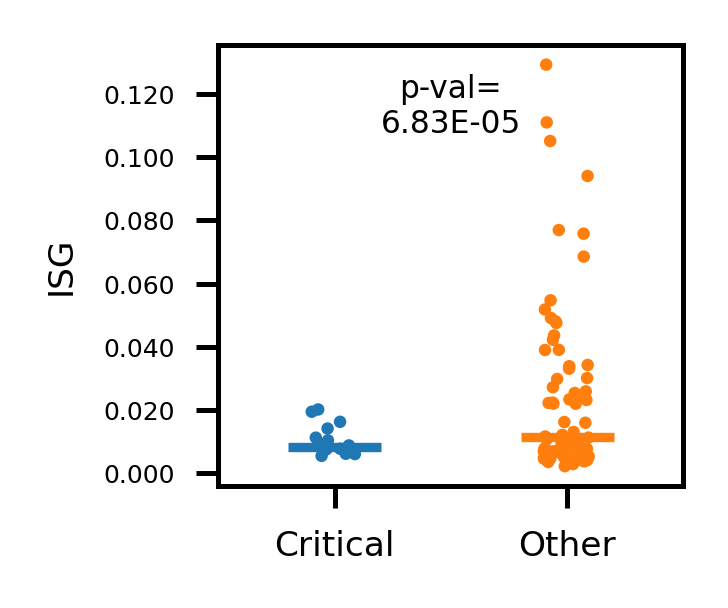

In [54]:
fig = sample_usage_striplot(prg_list, pheno_order, pheno, usage_meta_test, sample_col, cmap_stripplot, pheno_map,
                      height_scalar = 1.3, 
                      pt_size = 2, min_cells = 10, show_pvalue = True,
                     titlesize = 8, mean = True,
                            qntl = 0.95, yticksize=4, labelsize = 5.5, 
                     wspace = 0.6, ncols = 1, width_scalar = 4/3, ranksums_test = False)
# fig.savefig(os.path.join(figdir, 'Stripplot.RAOA.png'), bbox_inches="tight")
# fig.savefig(os.path.join(figdir, 'Stripplot.RAOA.pdf'), bbox_inches="tight")


# COMBAT

In [ ]:
dataset = 'COMBAT'

In [ ]:
# for dataset in pheno_params['dataset'].unique():
sample_col = params.loc[dataset, 'sample_col']
individual_col = params.loc[dataset, 'individual_col']
usage = pd.read_csv(params.loc[dataset, 'tcat_fn'], index_col = 0, sep = '\t')

meta = pd.read_csv(params.loc[dataset, 'metadata_fn'].replace('metadata', 'metadata_PhenotypeAssociations'),
                  index_col = 0, sep = '\t')
pheno_params_ds = pheno_params[pheno_params['dataset']==dataset]
res_df_ds = res_df[res_df['dataset']==dataset]

In [ ]:
pheno_cols = pheno_params_ds['pheno_col_orig'].unique()

In [ ]:
usage_meta = usage.merge(meta, left_index = True, right_index = True)
usage_meta = usage_meta.loc[usage.index, ]

# Define mean usage for each phenotype
usage_phenos = pd.DataFrame()
for pheno in pheno_cols:
    with rc_context({'figure.figsize': (4, 4), 'figure.dpi':200}):
        avg_usg = usage.groupby(meta.loc[usage.index, pheno]).mean().T
        usage_phenos = pd.concat([usage_phenos, avg_usg], axis = 1)
        # g = sns.clustermap(avg_usg)
        # plt.show()


In [ ]:
pheno_cols

In [ ]:
pheno = pheno_cols[0]
color_col = pheno_cols[0]



In [ ]:
usage_meta_test = usage_meta.loc[usage_meta[pheno].dropna().index, ]

In [ ]:
pheno_orders = [usage_meta_test[x].unique() for x in pheno_cols]
pheno_order = pheno_orders[0]

In [ ]:
pheno_orders

In [ ]:
pheno_map = usage_meta[color_col].unique()
pheno_map = dict(zip( pheno_map, range(0, len(pheno_map))))


In [ ]:
ylim_dict = {}

In [ ]:
prg_list = res_df_ds[res_df_ds['padj']< 0.05].sort_values('log2fc', key = abs, ascending = False)
prg_list = prg_list[prg_list['pheno_col']==pheno]['cGEP'].unique()

In [ ]:
prg_list

In [ ]:
res_df_ds[res_df_ds['padj']< 0.05].sort_values('log2fc', key = abs, ascending = False)

In [ ]:
cmap = cm.get_cmap('tab10', 10)

In [ ]:
# pheno_label = [{'P':'PBMC', 'N': 'NAT', 'T':'Tumor'}, {}]


In [ ]:
pheno, pheno_order

In [ ]:
sample_usage_plot(prg_list, pheno_order, pheno, usage_meta_test, individual_col, 
                  cmap, ylim_dict, color_col, pheno_map, 
                 height_scalar = 1.3, figure_width = 7, xticksize = 5)

In [ ]:
sample_usage_plot(['ISG'], pheno_order, pheno, usage_meta_test, individual_col, 
                  cmap, ylim_dict, color_col, pheno_map, 
                 height_scalar = 1.3, figure_width = 7, xticksize = 5)

# Pan-Tissue

In [682]:
dataset = 'Pan-Tissue'

In [683]:
# for dataset in pheno_params['dataset'].unique():
sample_col = params.loc[dataset, 'sample_col']
individual_col = params.loc[dataset, 'individual_col']
usage = pd.read_csv(params.loc[dataset, 'tcat_fn'], index_col = 0, sep = '\t')
usage.columns = usage.columns.map(rename_map)

meta = pd.read_csv(params.loc[dataset, 'metadata_fn'].replace('metadata', 'metadata_PhenotypeAssociations'),
                  index_col = 0, sep = '\t')
pheno_params_ds = pheno_params[pheno_params['dataset']==dataset]
res_df_ds = res_df[res_df['dataset']==dataset]

/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3524: DtypeWarning: Columns (3) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [ ]:
# # Subset to non-binarized version of column variables 
# for pheno_col in pheno_params_ds['pheno_col_orig']:
    

In [684]:
pheno_cols = pheno_params_ds['pheno_col_orig'].unique()

In [685]:
usage_meta = usage.merge(meta, left_index = True, right_index = True)
usage_meta = usage_meta.loc[usage.index, ]

# Define mean usage for each phenotype
usage_phenos = pd.DataFrame()
for pheno in pheno_cols:
    with rc_context({'figure.figsize': (4, 4), 'figure.dpi':200}):
        avg_usg = usage.groupby(meta.loc[usage.index, pheno]).mean().T
        usage_phenos = pd.concat([usage_phenos, avg_usg], axis = 1)
        # g = sns.clustermap(avg_usg)
        # plt.show()

usage_meta_test = usage_meta

In [495]:
pheno_cols

array(['Organ', 'Lymph_or_NonLymph'], dtype=object)

In [686]:
pheno = pheno_cols[1]
color_col = pheno_cols[0]

pheno_orders = [usage_meta_test[x].unique() for x in pheno_cols]
pheno_order = pheno_orders[1]

In [538]:
pheno_orders

[array(['ILE', 'LNG', 'LLN', 'MLN', 'BMA', 'SKM', 'LIV', 'SPL', 'OME',
        'CAE', 'THY', 'DUO', 'TCL', 'SCL', 'JEJLP', 'JEJEPI'], dtype=object),
 array(['NonLymph', 'Lymph'], dtype=object)]

In [687]:
pheno_map = usage_meta[color_col].unique()
pheno_map = dict(zip( pheno_map, range(0, len(pheno_map))))


In [688]:
ylim_dict = {}

In [689]:
prg_list = res_df_ds[res_df_ds['padj']< 0.05].sort_values('log2fc', key = abs, ascending = False)
prg_list = prg_list[prg_list['pheno_col']==pheno]['cGEP'].unique()

In [222]:
res_df_ds[(res_df_ds['pheno_col']==pheno) & (res_df_ds['type']=='paired')].sort_values('pval').head(30)

,dataset,cGEP,t-stat,pval,padj,fold_change,pheno_col_orig,pheno_col,phenotypes,type,log2fc
2375,Pan-Tissue,Th2-1,-7.820662,0.000014,0.000746,0.432177,Lymph_or_NonLymph,Lymph_or_NonLymph,"NonLymph,Lymph",paired,-1.210305
2391,Pan-Tissue,Tfh-1,-7.440614,0.000022,0.001149,0.439333,Lymph_or_NonLymph,Lymph_or_NonLymph,"NonLymph,Lymph",paired,-1.186615
2360,Pan-Tissue,CD4-CM,-6.352766,0.000083,0.004327,0.335112,Lymph_or_NonLymph,Lymph_or_NonLymph,"NonLymph,Lymph",paired,-1.577285
2373,Pan-Tissue,IL10/IL19-Secretion,-6.049593,0.000124,0.006431,0.636459,Lymph_or_NonLymph,Lymph_or_NonLymph,"NonLymph,Lymph",paired,-0.651860
2368,Pan-Tissue,CD8-Naive,-5.982046,0.000135,0.007036,0.232914,Lymph_or_NonLymph,Lymph_or_NonLymph,"NonLymph,Lymph",paired,-2.102129
2365,Pan-Tissue,Treg,-5.929622,0.000145,0.007548,0.423344,Lymph_or_NonLymph,Lymph_or_NonLymph,"NonLymph,Lymph",paired,-1.240099
2364,Pan-Tissue,CD4-Naive,-5.753655,0.000184,0.009581,0.173944,Lymph_or_NonLymph,Lymph_or_NonLymph,"NonLymph,Lymph",paired,-2.523302
2377,Pan-Tissue,Doublet-Bcell,-5.593587,0.000230,0.011946,0.371477,Lymph_or_NonLymph,Lymph_or_NonLymph,"NonLymph,Lymph",paired,-1.428655
2380,Pan-Tissue,CD8-Trm-Like,5.560955,0.000240,0.012501,5.453556,Lymph_or_NonLymph,Lymph_or_NonLymph,"NonLymph,Lymph",paired,2.447197
2382,Pan-Tissue,Tfh-2,-4.838293,0.000683,0.035528,0.373078,Lymph_or_NonLymph,Lymph_or_NonLymph,"NonLymph,Lymph",paired,-1.422451


In [223]:
prg_list

array(['CD4-Naive', 'CD8-Trm-Like', 'CD8-Naive', 'Multi-Cytokine',
       'CD4-CM', 'Tph', 'Doublet-Bcell', 'Tfh-2', 'Treg', 'Th2-1',
       'Tfh-1', 'BCL2-Survival', 'gdT-Blood', 'IL10/IL19-Secretion'],
      dtype=object)

In [224]:
res_df_ds[res_df_ds['padj']< 0.05].sort_values('log2fc', key = abs, ascending = False)

,dataset,cGEP,t-stat,pval,padj,fold_change,pheno_col_orig,pheno_col,phenotypes,type,log2fc
2052,Pan-Tissue,CD4-Naive,8.789373,0.000002,0.000116,26.048911,Organ,Organ_Binary_DUO,"Other,DUO",unpaired,4.703151
1480,Pan-Tissue,CD4-Naive,-8.668041,0.000003,0.000137,0.040486,Organ,Organ_Binary_ILE,"ILE,Other",unpaired,-4.626420
1792,Pan-Tissue,CD4-Naive,8.490000,0.000002,0.000112,12.027280,Organ,Organ_Binary_LIV,"Other,LIV",unpaired,3.588239
1532,Pan-Tissue,CD4-Naive,7.488294,0.000006,0.000305,6.610223,Organ,Organ_Binary_LNG,"Other,LNG",unpaired,2.724699
1796,Pan-Tissue,CD8-Naive,6.150938,0.000049,0.002540,6.415637,Organ,Organ_Binary_LIV,"Other,LIV",unpaired,2.681592
...,...,...,...,...,...,...,...,...,...,...,...
1877,Pan-Tissue,Doublet-RBC,-4.285575,0.000926,0.048159,0.607002,Organ,Organ_Binary_OME,"Other,OME",unpaired,-0.720227
2373,Pan-Tissue,IL10/IL19-Secretion,-6.049593,0.000124,0.006431,0.636459,Lymph_or_NonLymph,Lymph_or_NonLymph,"NonLymph,Lymph",paired,-0.651860
2217,Pan-Tissue,IL10/IL19-Secretion,4.477149,0.000454,0.023610,1.549093,Organ,Organ_Binary_JEJLP,"Other,JEJLP",unpaired,0.631423
2269,Pan-Tissue,IL10/IL19-Secretion,4.650252,0.000314,0.016340,1.540282,Organ,Organ_Binary_JEJEPI,"Other,JEJEPI",unpaired,0.623194


In [690]:
cmap = cm.get_cmap('tab20', 20)

In [ ]:
# pheno_label = [{'P':'PBMC', 'N': 'NAT', 'T':'Tumor'}, {}]


In [226]:
pheno, pheno_order

('Lymph_or_NonLymph', array(['NonLymph', 'Lymph'], dtype=object))

In [227]:
pheno_order

array(['NonLymph', 'Lymph'], dtype=object)

In [228]:
usage_meta_test[color_col]

Pan_T7935490_AAACCTGCAAATTGCC       ILE
Pan_T7935490_AAACGGGCATCTGGTA       ILE
Pan_T7935490_AAACGGGTCTTGCATT       ILE
Pan_T7935490_AAAGCAATCATCGCTC       ILE
Pan_T7935490_AAAGTAGCAGTCACTA       ILE
                                  ...  
CZINY-0112_TTTGGTTAGGCCACTC      JEJEPI
CZINY-0112_TTTGGTTCACAAAGTA         SPL
CZINY-0112_TTTGGTTTCCATCACC         LNG
CZINY-0112_TTTGTTGCAGCGGTTC         SPL
CZINY-0112_TTTGTTGGTGCGACAA         SPL
Name: Organ, Length: 154314, dtype: object

In [229]:
sample_col

'SampleID'

/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:79: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:79: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:79: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:79: MatplotlibDeprecationWarning: Suppor

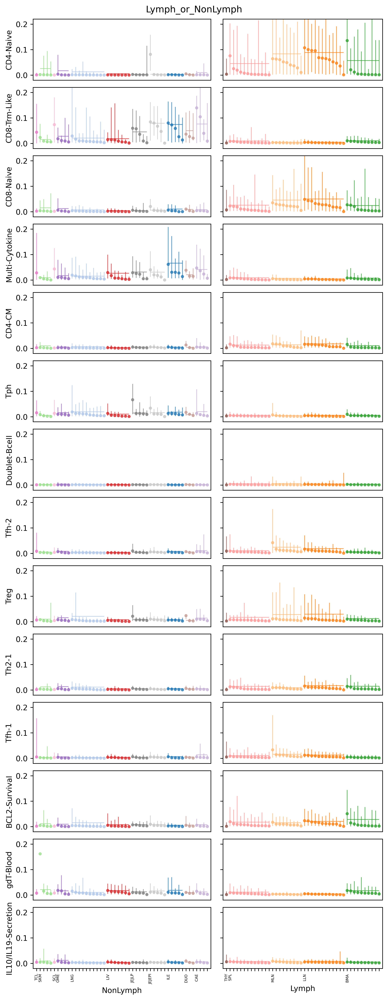

In [230]:
sample_usage_plot(prg_list, pheno_order, pheno, usage_meta_test, sample_col, 
                  cmap, ylim_dict, color_col, pheno_map, 
                 height_scalar = 1.3, figure_width = 7, xticksize = 5)

In [691]:
prg_list

array(['CD4-Naive', 'CD8-Trm-Like', 'CD8-Naive', 'Multi-Cytokine',
       'CD4-CM', 'Tph', 'Doublet-Bcell', 'Tfh-2', 'Treg', 'Th2-1',
       'Tfh-1', 'BCL2-Survival', 'gdT-Blood', 'IL10/IL19-Secretion'],
      dtype=object)

In [ ]:
pheno_order

In [692]:
prg_list = ['Treg', 'Tfh-1', 'Tfh-2', 'Multi-Cytokine', 'CD8-Trm-Like']

In [693]:
pheno_order = ['Lymph', 'NonLymph']

In [694]:
ylim_dict = {'MAIT': (-0.02, 0.42)}

In [695]:
pheno_label = {'Lymph' : 'Lymphoid', 'NonLymph' : 'NonLymphoid'}

/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:79: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:79: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:79: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:79: MatplotlibDeprecationWarning: Suppor

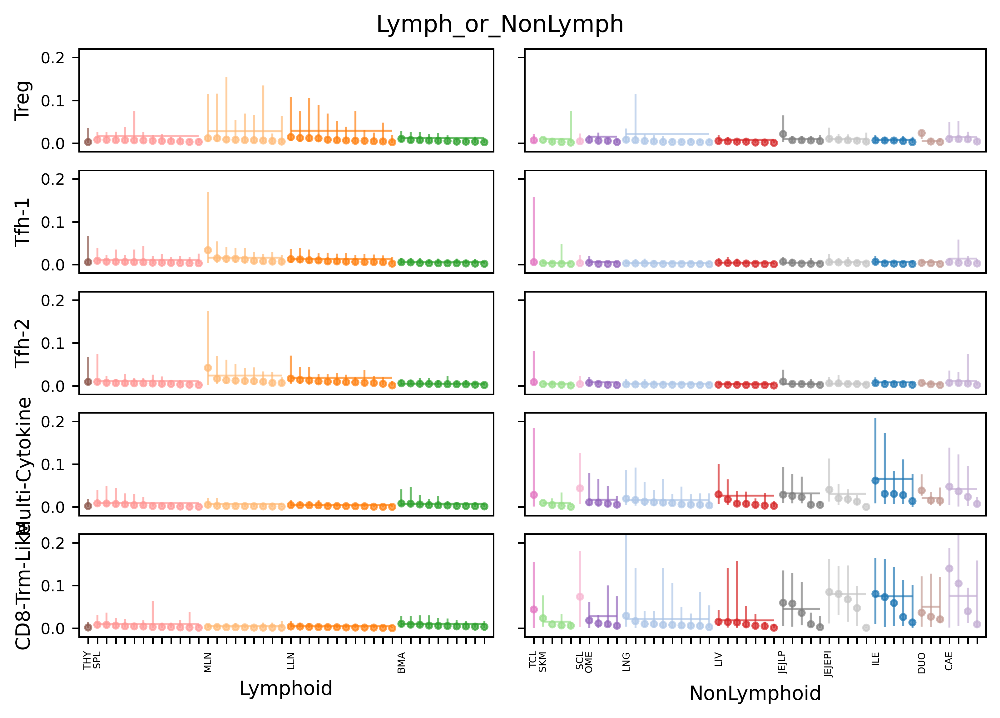

In [236]:
sample_usage_plot(prg_list, pheno_order, pheno, usage_meta_test, sample_col, 
                  cmap, ylim_dict, color_col, pheno_map, pheno_label = pheno_label,
                 height_scalar = 1, figure_width = 7, xticksize = 5, yticksize = 8, hspace = 0)

In [696]:
prg_list = ['Treg', 'Tfh-2', 'CD8-Trm-Like']

In [697]:
ylim_dict = {'Tfh-2': (-0.02, 0.18), 'Treg':(-0.02, 0.18)}

Num samples with <= 10 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:86: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 5


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:86: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:86: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 5


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:86: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.


Num samples with <= 10 cells: 0


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:91: UserWarning: FixedFormatter should only be used together with FixedLocator


Num samples with <= 10 cells: 5


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:91: UserWarning: FixedFormatter should only be used together with FixedLocator


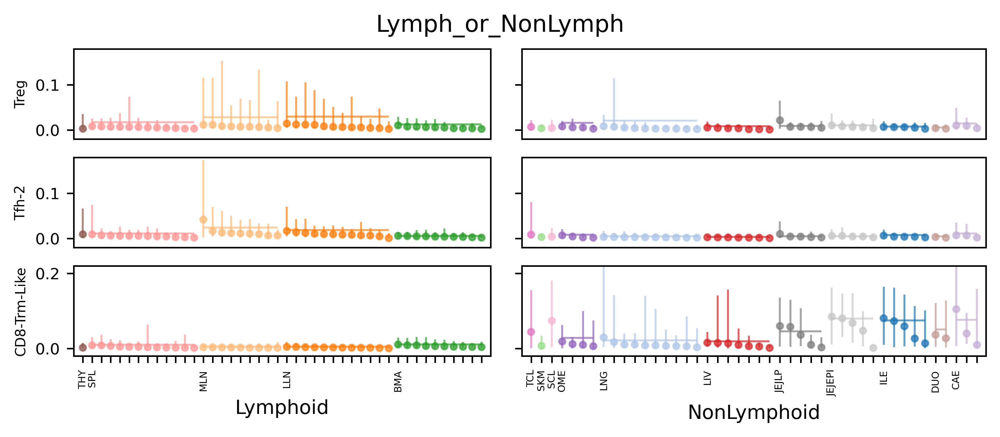

In [509]:
sample_usage_plot(prg_list, pheno_order, pheno, usage_meta_test, sample_col, 
                  cmap, ylim_dict, color_col, pheno_map, pheno_label = pheno_label,
                 height_scalar = 1, figure_width = 7, xticksize = 5, yticksize = 8, hspace = 0, 
                  ylabel_fontsize = 7, min_cells = 10)

In [ ]:
### Constrained layout = False
# sample_usage_plot(prg_list, pheno_order, pheno, usage_meta_test, sample_col, 
#                   cmap, ylim_dict, color_col, pheno_map, 
#                  height_scalar = .7, figure_width = 7, xticksize = 5, yticksize = 6, hspace = 0.07)

## Strip plots

In [331]:
# cmap_stripplot = cm.get_cmap('tab10', 10)

# nrows = len(prg_list)
# ncols = 1#len(pheno_order)
# figure_width = 2
# height_scalar = 1.6
# figure_height = height_scalar*len(prg_list)

# pt_size = 2

# fig, axes = plt.subplots(constrained_layout=True,dpi=450, figsize=(figure_width,figure_height),
#                  nrows = nrows, ncols =  ncols) 
# for k, prg in enumerate(prg_list):
#     print(prg)

#     dat = pd.DataFrame()

#     for j, pheno_name in enumerate(pheno_order):
#         pheno_usg = usage_meta_test[usage_meta_test[pheno]== pheno_order[j]]
#         sample_quant_usg = pd.DataFrame(pheno_usg[[prg, sample_col]].groupby(sample_col).quantile(.95))
#         sample_quant_usg[pheno] = pheno_name
#         dat = dat.append(sample_quant_usg.reset_index())
#         dat_mean = dat.groupby(pheno).median()

#     # fig, ax = plt.subplots()
#     ax = axes[k]
#     sns.stripplot(data=dat, x=pheno, y=prg, order = pheno_order, ax = ax, size = pt_size)
#     xlim = ax.get_xlim()

#     for j, pheno_name in enumerate(pheno_order):
#         ax.hlines(y = dat_mean.loc[pheno_name][0], xmin = j-.2, xmax = j+.2, color = cmap_stripplot(j))    

#     ax.set_xlim(xlim)
#     # plt.show()
    
#     if k==(nrows-1):
#         axes[k].set_xlabel(pheno)
#     else:
#         axes[k].set_xlabel('')



Treg
Tfh-2
CD8-Trm-Like


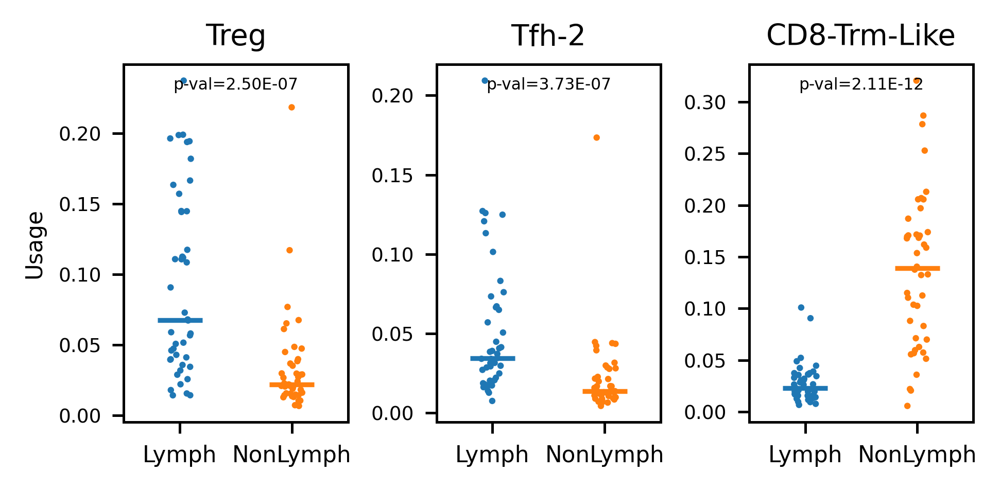

In [698]:
sample_usage_striplot(prg_list, pheno_order, pheno, usage_meta_test, sample_col, cmap_stripplot, pheno_map,
                     figure_height = 2, width_scalar = 1.4, pt_size = 2, min_cells = 10, show_pvalue = True)

Treg
Tfh-2
CD8-Trm-Like


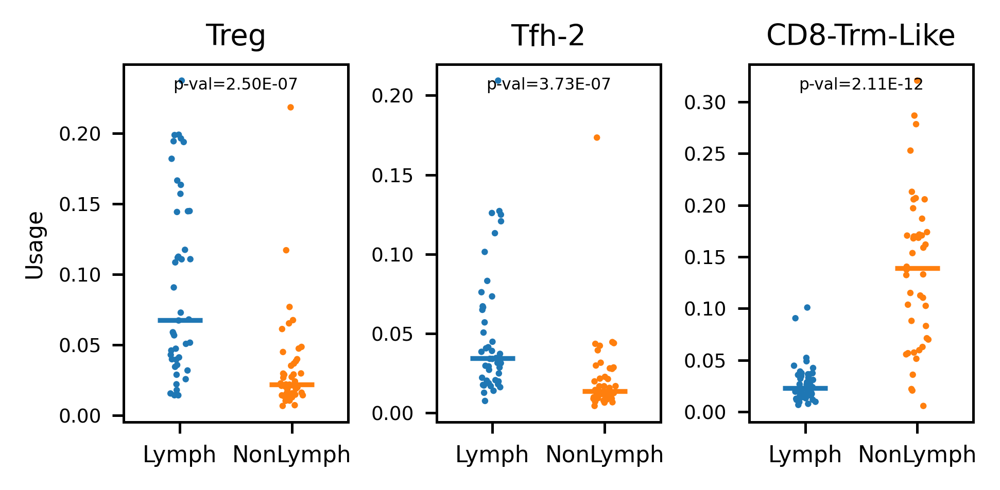

In [632]:
# sample_usage_striplot(prg_list, pheno_order, pheno, usage_meta_test, sample_col, cmap_stripplot, pheno_map,
#                      figure_height = 2, width_scalar = 1.4, pt_size = 2, min_cells = 10, show_pvalue = True)